In [1]:
from google.colab import drive
drive.mount('/content/drive', force_remount = True)

Mounted at /content/drive


In [2]:
%cd /content/drive/MyDrive/Time\ Series\ Project
!ls

/content/drive/MyDrive/Time Series Project
 Kobe_temperature.ipynb  'Simulation AR(1).ipynb'	  timegan_utils.py
 Kobe_weather.csv	  Simulation_other_series.ipynb
 __pycache__		  timegan_utils2.py


In [3]:
#importing libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy import stats
%matplotlib inline
from statsmodels.tsa.stattools import acf
from statsmodels.graphics.tsaplots import plot_acf
from statsmodels.graphics.tsaplots import plot_pacf
from statsmodels.tsa.ar_model import AutoReg
import importlib
import timegan_utils

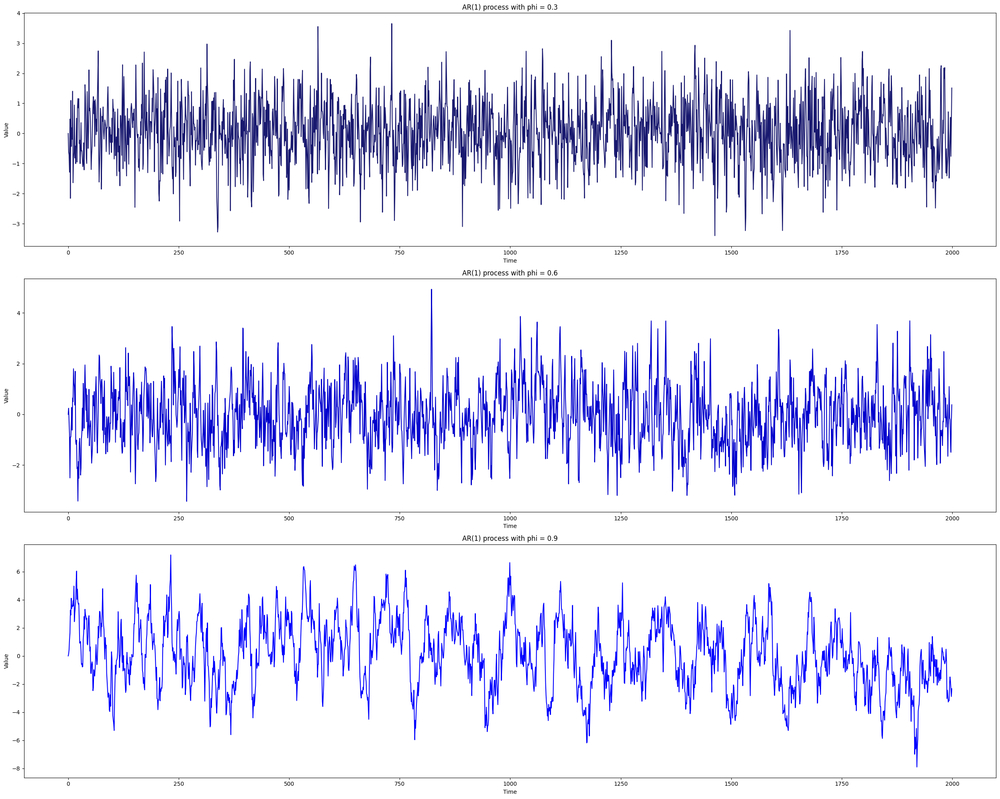

In [4]:
np.random.seed(1)

#Length of time series and parameters phi
n = 2000
phi1 = 0.3
phi2 = 0.6
phi3 = 0.9

x = np.zeros(n)
y = np.zeros(n)
z = np.zeros(n)

epsilon1 = np.random.normal(0, 1, n)
epsilon2 = np.random.normal(0, 1, n)
epsilon3 = np.random.normal(0, 1, n)

#Generating AR(1) time series data for each phi
for i in range(1, n):
  x[i] = phi1 * x[i-1] + epsilon1[i]
  y[i] = phi2 * y[i-1] + epsilon2[i]
  z[i] = phi3 * z[i-1] + epsilon3[i]

series = [x, y, z]
titles = ['phi = 0.3', 'phi = 0.6', 'phi = 0.9']
colors = ['midnightblue', 'mediumblue', 'blue']

#Plotting each time series
fig, axes = plt.subplots(3, 1, figsize = (25, 20))

for i in range(3):
  axes[i].plot(series[i], color = colors[i])
  axes[i].set_title(f'AR(1) process with {titles[i]}')
  axes[i].set_xlabel('Time')
  axes[i].set_ylabel('Value')

plt.tight_layout()
plt.show()

Descriptive Statistics

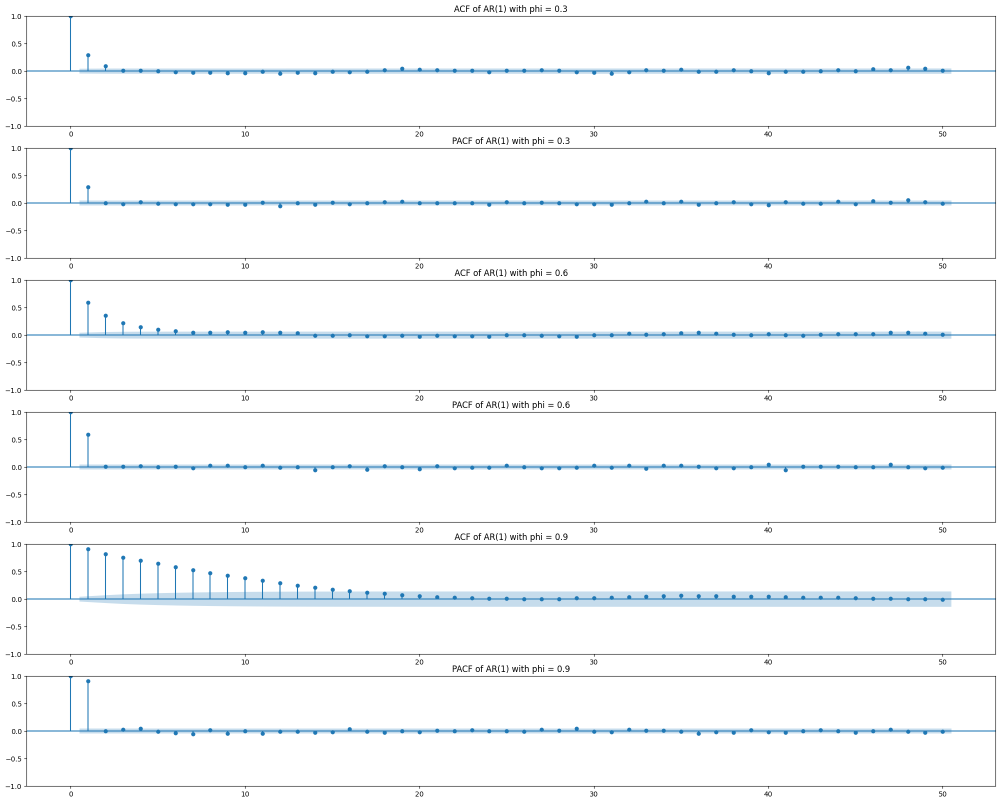

In [5]:
#Plotting acf and pacf for each series
fig, axes = plt.subplots(6, 1, figsize=(25, 20))
plot_acf(x, lags = 50, ax = axes[0])
axes[0].set_title('ACF of AR(1) with phi = 0.3')
plot_pacf(x, lags = 50, ax = axes[1])
axes[1].set_title('PACF of AR(1) with phi = 0.3')

plot_acf(y, lags = 50, ax = axes[2])
axes[2].set_title('ACF of AR(1) with phi = 0.6')
plot_pacf(y, lags = 50, ax = axes[3])
axes[3].set_title('PACF of AR(1) with phi = 0.6')

plot_acf(z, lags = 50, ax = axes[4])
axes[4].set_title('ACF of AR(1) with phi = 0.9')
plot_pacf(z, lags = 50, ax = axes[5])
axes[5].set_title('PACF of AR(1) with phi = 0.9')

plt.show()

In [6]:
#Means and variances of each series
print("Mean of series x:", np.mean(x))
print("Variance of series x:", np.var(x))
print('----------------------------------')
print("Mean of series y:", np.mean(y))
print("Variance of series y:", np.var(y))
print('----------------------------------')
print("Mean of series z:", np.mean(z))
print("Variance of series z:", np.var(z))

Mean of series x: 0.04575699760134527
Variance of series x: 1.1060118082566286
----------------------------------
Mean of series y: -0.024106201982752918
Variance of series y: 1.511045705840641
----------------------------------
Mean of series z: 0.12865097629665143
Variance of series z: 5.768238775182579


These AR(1) series are stationary time series, thus we can create the synthetic time series data without detrending.

In [7]:
def moving_block_bootstrap(series, block_size, outputlength = None):
  seriesLength = len(series)

  #Addressing edge cases
  if outputlength is None:
    outputlength = seriesLength

  if block_size <= 0:
    raise ValueError("The size of block must be positive.")

  if block_size > seriesLength:
    raise ValueError("The size of block cannot be greater than the length of the series.")

  numBlocks = seriesLength - block_size + 1

  #Creating the overlapping blocks
  blocks = []
  for i in range(numBlocks):
    block = series[i:i+block_size]
    blocks.append(block)

  #Randomly choosing the blocks
  numSampleBlocks = int(np.ceil(outputlength / block_size))
  sampleIndices = np.random.choice(numBlocks, size = numSampleBlocks, replace = True)

  #Concatenating the randomly selected blocks
  selectedBlocks = []
  for i in sampleIndices:
    block = blocks[i]
    selectedBlocks.append(block)

  synthetic = np.concatenate(selectedBlocks)

  return synthetic[:outputlength]

In [8]:
np.random.seed(0)

#Storing series in a dictionary
originalSeries = {
    "phi = 0.3": x,
    "phi = 0.6": y,
    "phi = 0.9": z
}

blockSizes = [10, 20, 50, 100]
MBBsynthetic_examples = {}


for blockSize in blockSizes:
  #Creating empty boxes for each block size.
  MBBsynthetic_examples[blockSize] = {}

  #Creating synthetic data for each phi and block size
  for name, series in originalSeries.items():
    synthetic = moving_block_bootstrap(series, blockSize)
    MBBsynthetic_examples[blockSize][name] = synthetic

In [9]:
#Declaring phi values and colours for each series
phiNames = ["phi = 0.3", "phi = 0.6", "phi = 0.9"]
colorsOrig = ['midnightblue', 'mediumblue', 'blue']
colorsSynth = ['maroon', 'darkred', 'red']

#Iterate through each phi values
for i, name in enumerate(phiNames):
    fig, axes = plt.subplots(4, 1, figsize=(25, 18))

    original = originalSeries[name]

    #Iterate through each block size for each phi values respectively and plot original and synthetic time series
    for j, block_size in enumerate(blockSizes):
        synthetic = MBBsynthetic_examples[block_size][name]

        axes[j].plot(original, color=colorsOrig[i], linewidth=2, label="Original")
        axes[j].plot(synthetic, color=colorsSynth[i], linewidth=1.5, label="MBB synthetic")

        axes[j].set_title(f"{name}, block size = {block_size}")
        axes[j].set_xlabel("Time")
        axes[j].set_ylabel("Value")
        axes[j].legend(loc="upper right")

    plt.tight_layout()
    plt.show()

Output hidden; open in https://colab.research.google.com to view.

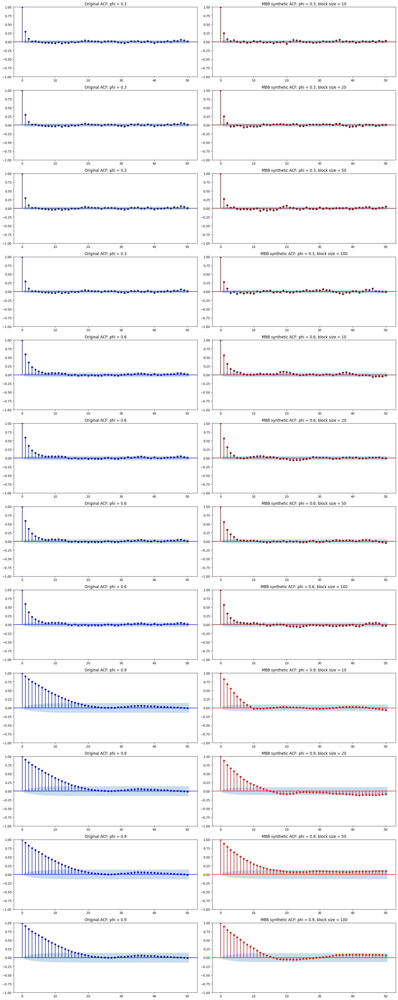

In [10]:
#Plotting the acf for original and the corresponding synthetic with 12 by 2 design
fig, axes = plt.subplots(12, 2, figsize = (18, 45))

plotIndex = 0

for i, name in enumerate(phiNames):
  original = originalSeries[name]

  for blockSize in blockSizes:
    synthetic = MBBsynthetic_examples[blockSize][name]

    #Until lag 50
    plot_acf(original, ax=axes[plotIndex, 0], lags = 50, color = colorsOrig[i], vlines_kwargs={'colors': colorsOrig[i]})
    axes[plotIndex, 0].set_title(f'Original ACF: {name}')

    plot_acf(synthetic, ax=axes[plotIndex, 1], lags=50, color=colorsSynth[i], vlines_kwargs={'colors': colorsSynth[i]})
    axes[plotIndex, 1].set_title(f'MBB synthetic ACF: {name}, block size = {blockSize}')

    #Add 1 to plot index so that it can move on to the next block size / phi
    plotIndex += 1

plt.tight_layout()
plt.show()

Monte Carlo Simulation for the analysis of methods

In [11]:
np.random.seed(0)

#Monte Carlo simulation with 500 samples of synthetic data
B = 500

originalSeries = {
    "phi = 0.3": x,
    "phi = 0.6": y,
    "phi = 0.9": z
}

MBBsamplesAll = {}

#Each block size
for blockSize in blockSizes:
  MBBsamplesAll[blockSize] = {}

  #Each phi for time series
  for name, series in originalSeries.items():
    samples = []

    #Producing 500 samples of synthetic data
    for b in range(B):
      sample = moving_block_bootstrap(series, blockSize)
      samples.append(sample)

    #Storing the generated 500 samples
    MBBsamplesAll[blockSize][name] = np.array(samples)

In [12]:
#Checking the shape for each block size and series
for blockSize in blockSizes:
  for name in originalSeries:
    print(blockSize, name, MBBsamplesAll[blockSize][name].shape)

10 phi = 0.3 (500, 2000)
10 phi = 0.6 (500, 2000)
10 phi = 0.9 (500, 2000)
20 phi = 0.3 (500, 2000)
20 phi = 0.6 (500, 2000)
20 phi = 0.9 (500, 2000)
50 phi = 0.3 (500, 2000)
50 phi = 0.6 (500, 2000)
50 phi = 0.9 (500, 2000)
100 phi = 0.3 (500, 2000)
100 phi = 0.6 (500, 2000)
100 phi = 0.9 (500, 2000)


In [13]:
#5 synthetic data to plot
numToPlot = 5

fig, axes = plt.subplots(12, 1, figsize=(25, 45))

plotIndex = 0

for i, name in enumerate(phiNames):
  original = originalSeries[name]

  for blockSize in blockSizes:
    samples = MBBsamplesAll[blockSize][name]

    #Plotting 5 synthetic data in this loop over the same original time series data
    for k in range(numToPlot):
      axes[plotIndex].plot(samples[k], color = colorsSynth[i], alpha = 0.5, linewidth = 1, label = 'MBB synthetic' if k == 0 else None)

    axes[plotIndex].plot(original, color = colorsOrig[i], linewidth = 2, label = 'Original')
    axes[plotIndex].set_title(f'MBB synthetic time series with {name}, block size = {blockSize}')
    axes[plotIndex].set_xlabel('Time')
    axes[plotIndex].set_ylabel('Value')
    axes[plotIndex].legend(loc = 'upper right')

    #Add 1 to plot index so that it can move on to the next block size / phi
    plotIndex += 1

plt.tight_layout()
plt.show()

Output hidden; open in https://colab.research.google.com to view.

In [14]:
#This function returns a numpy array of autocorrelation values.
def acf_values(series, maxLag = 50):
  return acf(series, nlags = maxLag)

#acf value function for many sanmples up to lag 50.
def compute_acf_for_samples(samples, maxLag = 50):
  acfs = []
  for sample in samples:
    acfs.append(acf_values(sample, maxLag))
  return np.array(acfs)

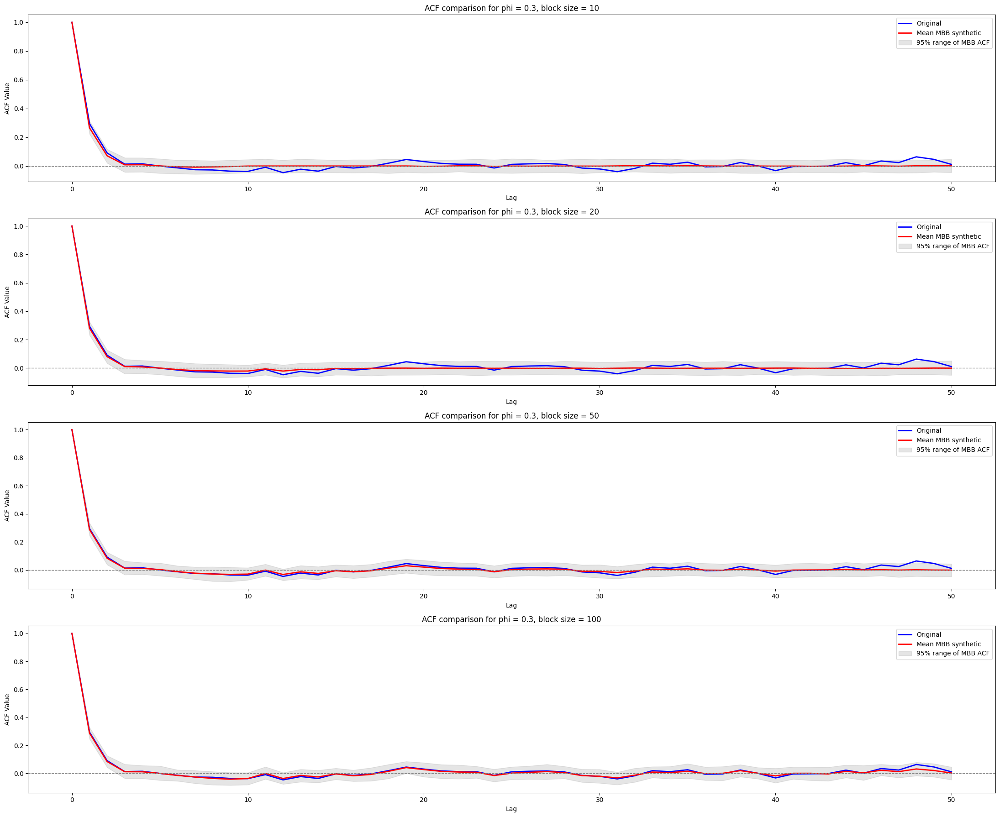

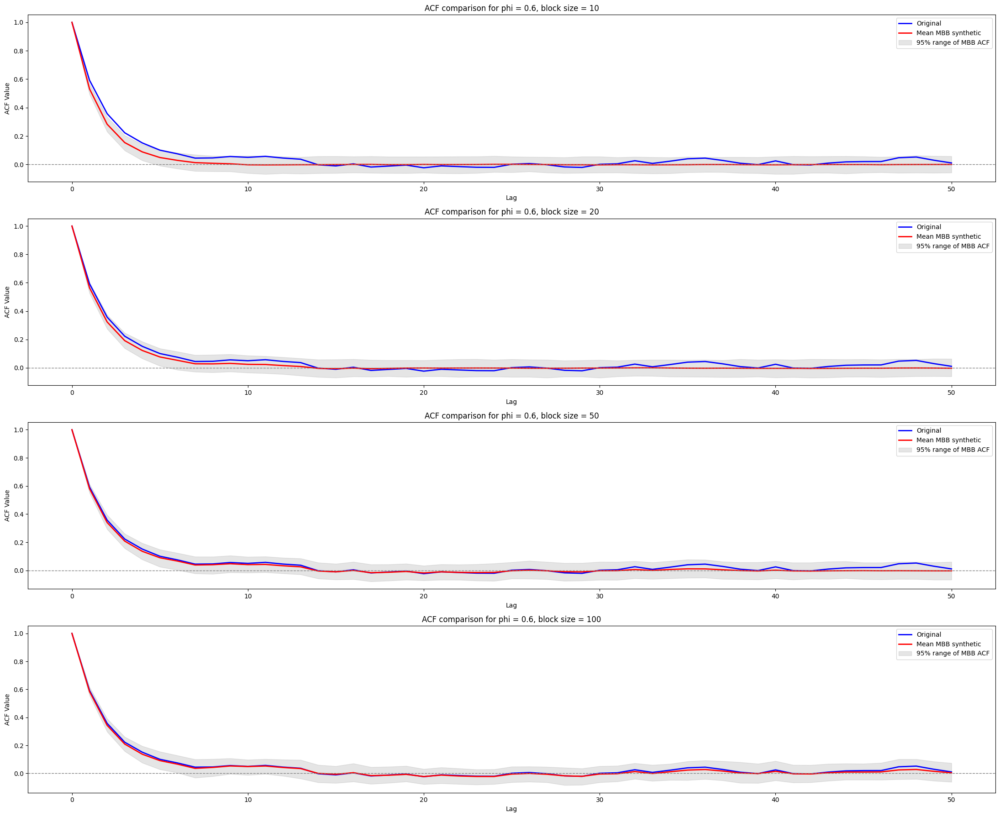

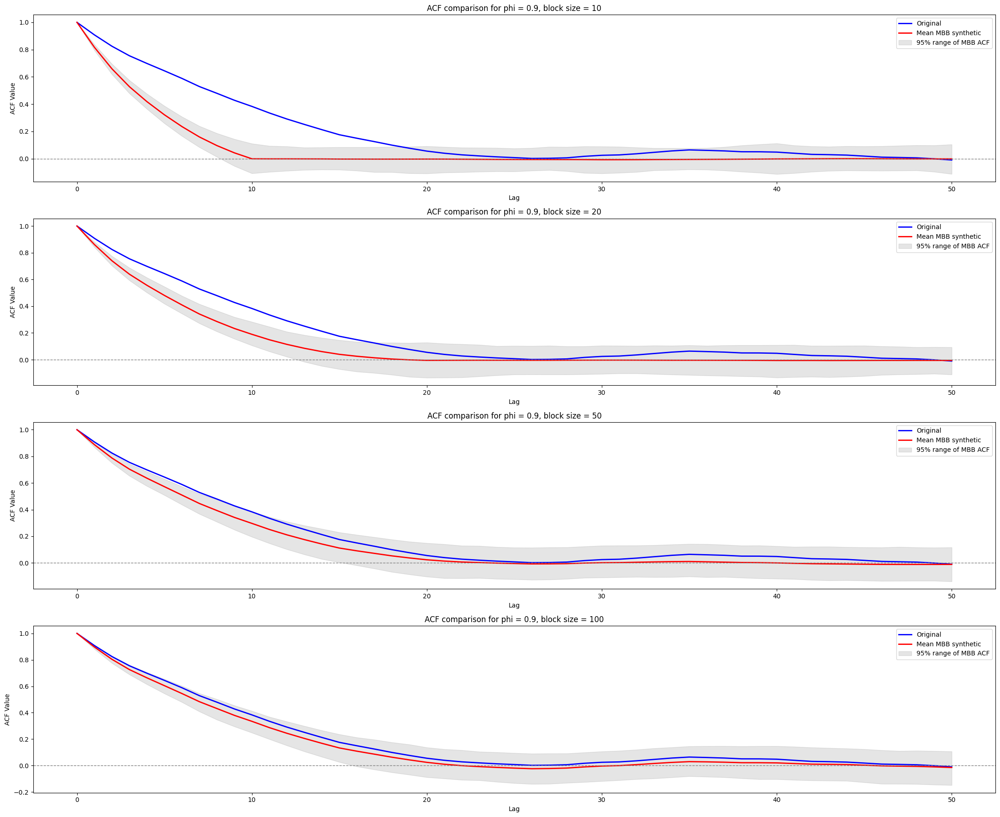

In [15]:
maxLag = 50
lags = np.arange(maxLag + 1)

#Comparing the acf of original and synthetic for each series and block
for i, name in enumerate(phiNames):
  fig, axes = plt.subplots(4, 1, figsize = (22, 18))

  original = originalSeries[name]
  originalACF = acf_values(original, maxLag = maxLag)

  for j, blockSize in enumerate(blockSizes):
    samples = MBBsamplesAll[blockSize][name]
    samplesACF = compute_acf_for_samples(samples, maxLag=maxLag)

    #Percentile, not a critical value of confidence interval
    meanACF = np.mean(samplesACF, axis = 0)
    lowerACF = np.percentile(samplesACF, 2.5, axis = 0)
    upperACF = np.percentile(samplesACF, 97.5, axis = 0)

    axes[j].plot(lags, originalACF, color = 'blue', linewidth = 2, label = 'Original')
    axes[j].plot(lags, meanACF, color = 'red', linewidth = 2, label = 'Mean MBB synthetic')
    #95% range
    axes[j].fill_between(lags, lowerACF, upperACF, color = 'gray', alpha = 0.2, label = "95% range of MBB ACF")

    axes[j].axhline(0, color = 'gray', linestyle = '--', linewidth = 1)
    axes[j].set_title(f'ACF comparison for {name}, block size = {blockSize}')
    axes[j].set_xlabel('Lag')
    axes[j].set_ylabel('ACF Value')
    axes[j].legend(loc = 'upper right')

  plt.tight_layout()
  plt.show()

In [16]:
def acf_error(original, synthetic, maxLag = 50):
  #Computing the original and synthetic ACF values
  originalACF = acf_values(original, maxLag = maxLag)
  syntheticACF = acf_values(synthetic, maxLag = maxLag)

  #Excluding lag 0 since it is always 1
  return np.sum((originalACF[1:] - syntheticACF[1:])**2)

def mean_error(original, synthetic):
    #Difference between the mean of original and synthetic
    return abs(np.mean(original) - np.mean(synthetic))

def variance_error(original, synthetic):
    #Difference between the variance of original and synthetic
    return abs(np.var(original) - np.var(synthetic))

def monte_carlo_ci(values):
  values = np.array(values)

  #Statistics across Monte Carlo Samples
  meanValue = np.mean(values)
  #ddof = 1 is set to compute sample standard deviation
  stdValue = np.std(values, ddof = 1)
  seValue = stdValue / np.sqrt(len(values))

  lowerCI = meanValue - 1.96 * seValue
  upperCI = meanValue + 1.96 * seValue

  return round(meanValue, 4), [round(lowerCI, 4), round(upperCI, 4)]

In [17]:
rows = []

for blockSize in blockSizes:
  for name, original in originalSeries.items():
    samples = MBBsamplesAll[blockSize][name]

    meanErrors = []
    varianceErrors = []
    acfErrors = []

    for sample in samples:
      meanErrors.append(mean_error(original, sample))
      varianceErrors.append(variance_error(original, sample))
      acfErrors.append(acf_error(original, sample, maxLag = maxLag))

    meanACF, acfCI = monte_carlo_ci(acfErrors)
    meanMeanError, meanErrorCI = monte_carlo_ci(meanErrors)
    meanVarianceError, varianceErrorCI = monte_carlo_ci(varianceErrors)

    #Creating table of the result
    rows.append({
        "Method": "Moving Block Bootstrap",
        "Tuning": f"block size = {blockSize}",
        "Series": f"AR(1) with {name}",

        "mean_acf_error": meanACF,
        "acf_error_95ci": acfCI,

        "mean_error_mean": meanMeanError,
        "mean_error_95ci": meanErrorCI,

        "variance_error_mean": meanVarianceError,
        "variance_error_95ci": varianceErrorCI
      })

mbbSummary = pd.DataFrame(rows)

mbbSummary

,Method,Tuning,Series,mean_acf_error,acf_error_95ci,mean_error_mean,mean_error_95ci,variance_error_mean,variance_error_95ci
0,Moving Block Bootstrap,block size = 10,AR(1) with phi = 0.3,0.0555,"[0.0545, 0.0565]",0.0240,"[0.0225, 0.0256]",0.0310,"[0.0289, 0.0331]"
1,Moving Block Bootstrap,block size = 10,AR(1) with phi = 0.6,0.0978,"[0.0951, 0.1006]",0.0423,"[0.0396, 0.045]",0.0547,"[0.0512, 0.0582]"
2,Moving Block Bootstrap,block size = 10,AR(1) with phi = 0.9,1.5195,"[1.4911, 1.548]",0.1223,"[0.1144, 0.1302]",0.3147,"[0.2941, 0.3353]"
3,Moving Block Bootstrap,block size = 20,AR(1) with phi = 0.3,0.0506,"[0.0495, 0.0517]",0.0233,"[0.0217, 0.0249]",0.0304,"[0.0284, 0.0323]"
4,Moving Block Bootstrap,block size = 20,AR(1) with phi = 0.6,0.0749,"[0.0724, 0.0774]",0.0438,"[0.0406, 0.0469]",0.0496,"[0.0464, 0.0528]"
5,Moving Block Bootstrap,block size = 20,AR(1) with phi = 0.9,0.6142,"[0.5917, 0.6366]",0.1496,"[0.1401, 0.1592]",0.3407,"[0.3183, 0.3631]"
6,Moving Block Bootstrap,block size = 50,AR(1) with phi = 0.3,0.0400,"[0.0391, 0.0409]",0.0215,"[0.02, 0.023]",0.0297,"[0.0277, 0.0316]"
7,Moving Block Bootstrap,block size = 50,AR(1) with phi = 0.6,0.0601,"[0.0579, 0.0622]",0.0506,"[0.0474, 0.0539]",0.0475,"[0.0444, 0.0507]"
8,Moving Block Bootstrap,block size = 50,AR(1) with phi = 0.9,0.2826,"[0.2659, 0.2992]",0.1724,"[0.1615, 0.1834]",0.3221,"[0.3006, 0.3436]"
9,Moving Block Bootstrap,block size = 100,AR(1) with phi = 0.3,0.0311,"[0.0302, 0.032]",0.0250,"[0.0234, 0.0266]",0.0334,"[0.0312, 0.0356]"


Different Method of synthetic data generation (Sieve Bootstrap)

In [18]:
def sieve_bootstrap(series, p, outputlength=None, burn_in=100):

    seriesLength = len(series)

    #Addressing edge cases
    if outputlength is None:
        outputlength = seriesLength

    if p <= 0:
        raise ValueError("The AR order p must be positive.")

    if p >= seriesLength:
        raise ValueError("The AR order p must be smaller than the length of the series.")

    #Fitting an AR(p) model to the original series
    model = AutoReg(series, lags=p, trend='c', old_names=False).fit()

    #Extracting parameters from [intercept, phi_1, phi_2, phi_3...]
    intercept = model.params[0]
    phi_hat = model.params[1:]

    residuals = model.resid
    #Centering around zero
    residuals = residuals - np.mean(residuals)

    #Burn-in is added to reduce the effect of initial values
    totalLength = outputlength + burn_in

    #Random sample of residuals
    bootResiduals = np.random.choice(residuals, size=totalLength, replace=True)

    synthetic = np.zeros(totalLength)
    synthetic[:p] = series[:p]

    for i in range(p, totalLength):
        #Getting the previous p values (not p-value) and reversing them to match coefficients (X(t-1),...X(t-p))
        pastValues = synthetic[i-p:i][::-1]
        synthetic[i] = intercept + np.dot(phi_hat, pastValues) + bootResiduals[i]

    #Removing the burn-in
    return synthetic[burn_in:]

In [19]:
def select_ar_order(series, maxP = 50, criterion = 'BIC'):
  #To store AIC and BIC values for each AR order
  results = []

  #Fitting AR models from p = 1 to maxP
  for p in range(1, maxP + 1):

    model = AutoReg(series, lags = p, trend = 'c', old_names = False).fit()

    results.append({
        'p': p,
        'AIC': model.aic,
        'BIC': model.bic
    })

  results = pd.DataFrame(results)

  #Selecting the AR order with the smallest AIC or BIC
  if criterion == 'AIC':
    selectedP = int(results.loc[results['AIC'].idxmin(), 'p'])
  elif criterion == 'BIC':
    selectedP = int(results.loc[results['BIC'].idxmin(), 'p'])
  else:
    raise ValueError('Criterion must be either AIC or BIC.')

  return selectedP, results

In [20]:
selectedOrdersAIC = {}
selectedOrdersBIC = {}
orderSelectionTables = {}

#Selecting AR orders for each stationary series
for name, series in originalSeries.items():
  i, orderTable = select_ar_order(series, maxP = 50, criterion = 'BIC')

  #Creating a table of AIC and BIC values for AR orders from 1 to 50. idxmin() is the index value where it gets minimum value
  selectedPAIC = int(orderTable.loc[orderTable['AIC'].idxmin(), "p"])
  selectedPBIC = int(orderTable.loc[orderTable['BIC'].idxmin(), "p"])

  #Storing the selected orders and selection table
  selectedOrdersAIC[name] = selectedPAIC
  selectedOrdersBIC[name] = selectedPBIC
  orderSelectionTables[name] = orderTable

  print(name)
  print("AIC selected p:", selectedPAIC)
  print("BIC selected p:", selectedPBIC)
  print(orderTable)
  print()

phi = 0.3
AIC selected p: 50
BIC selected p: 1
     p          AIC          BIC
0    1  5700.601558  5717.402765
1    2  5700.298827  5722.698435
2    3  5699.557288  5727.554295
3    4  5697.945359  5731.538762
4    5  5697.282181  5736.470977
5    6  5691.704426  5736.487609
6    7  5688.276340  5738.652907
7    8  5687.391313  5743.360258
8    9  5686.327031  5747.887346
9   10  5685.521500  5752.672179
10  11  5683.606452  5756.346487
11  12  5674.262507  5752.590888
12  13  5674.227710  5758.143429
13  14  5672.461279  5761.963325
14  15  5671.184332  5766.271693
15  16  5669.159046  5769.830711
16  17  5669.299577  5775.554534
17  18  5667.280077  5779.117311
18  19  5665.157711  5782.576209
19  20  5665.133763  5788.132510
20  21  5664.250228  5792.828208
21  22  5663.444294  5797.600490
22  23  5662.504323  5802.237719
23  24  5661.185436  5806.495013
24  25  5659.057008  5809.941747
25  26  5658.295657  5814.754539
26  27  5658.102657  5820.134662
27  28  5657.015775  5824.619

In [21]:
print(selectedOrdersAIC)
print(selectedOrdersBIC)

{'phi = 0.3': 50, 'phi = 0.6': 50, 'phi = 0.9': 50}
{'phi = 0.3': 1, 'phi = 0.6': 1, 'phi = 0.9': 1}


In [22]:
np.random.seed(0)

#Storing the minimum order for AIC/BIC
orderChoices = {
    "AIC": selectedOrdersAIC,
    "BIC": selectedOrdersBIC
}

SIEVEsyntheticExamples = {}

for criterion, selectedOrders in orderChoices.items():

  SIEVEsyntheticExamples[criterion] = {}

  # Generate synthetic series for each series
  for name, series in originalSeries.items():

    p = selectedOrders[name]

    synthetic = sieve_bootstrap(series, p)

    SIEVEsyntheticExamples[criterion][name] = synthetic

    print(criterion, name, "p =", p, synthetic.shape)
  print()

AIC phi = 0.3 p = 50 (2000,)
AIC phi = 0.6 p = 50 (2000,)
AIC phi = 0.9 p = 50 (2000,)

BIC phi = 0.3 p = 1 (2000,)
BIC phi = 0.6 p = 1 (2000,)
BIC phi = 0.9 p = 1 (2000,)



In [23]:
colorsSieve = ['darkgreen', 'forestgreen', 'limegreen']

# Plot for each AIC/BIC
for criterion, selectedOrders in orderChoices.items():

  fig, axes = plt.subplots(3, 1, figsize = (25, 18))

  # Iterating through all phis
  for i, name in enumerate(phiNames):

    original = originalSeries[name]
    synthetic = SIEVEsyntheticExamples[criterion][name]

    p = selectedOrders[name]

    # Plot using p from each criterion and series
    axes[i].plot(original, color = colorsOrig[i], linewidth = 2, label = "Original")
    axes[i].plot(synthetic, color = colorsSieve[i], linewidth = 1.5, label = f"Sieve Bootstrap Synthetic ({criterion}, p = {p})")
    axes[i].set_title(f'Original vs Sieve Bootstrap Synthetic with {name}, {criterion} p = {p}')
    axes[i].set_xlabel('Time')
    axes[i].set_ylabel("Value")
    axes[i].legend(loc = 'upper right')

  plt.tight_layout()
  plt.show()

Output hidden; open in https://colab.research.google.com to view.

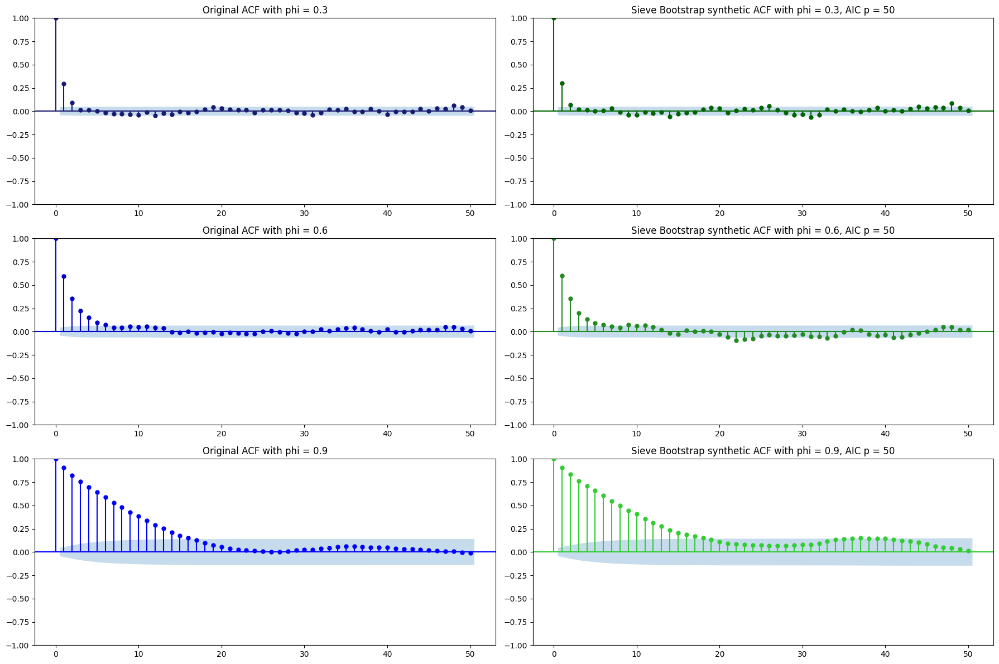

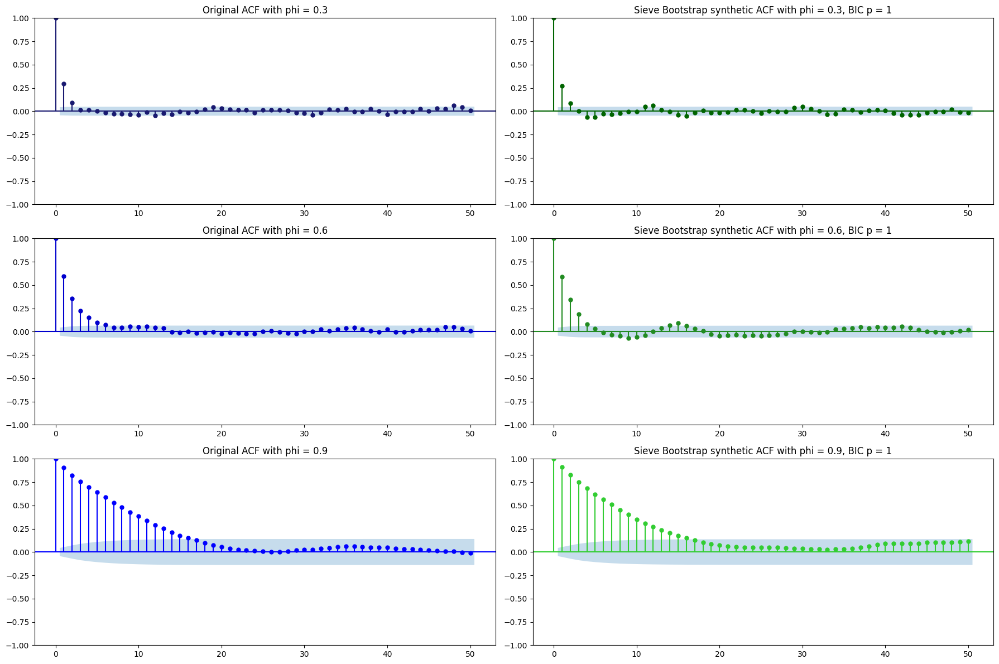

In [24]:
#ACF plot for AIC/BIC
for criterion, selectedOrders in orderChoices.items():

  fig, axes = plt.subplots(3, 2, figsize = (18, 12))

  #ACF plot for each series
  for i, name in enumerate(phiNames):
    original = originalSeries[name]
    synthetic = SIEVEsyntheticExamples[criterion][name]

    p = selectedOrders[name]

    plot_acf(original, ax = axes[i, 0], lags = 50, color = colorsOrig[i], vlines_kwargs = {'colors': colorsOrig[i]})
    axes[i, 0].set_title(f'Original ACF with {name}')

    plot_acf(synthetic, ax = axes[i, 1], lags = 50, color = colorsSieve[i], vlines_kwargs = {'colors': colorsSieve[i]})
    axes[i, 1].set_title(f'Sieve Bootstrap synthetic ACF with {name}, {criterion} p = {p}')

  plt.tight_layout()
  plt.show()

In [25]:
np.random.seed(0)

B = 500

SIEVEsamplesAll = {}

for criterion, selectedOrders in orderChoices.items():

  SIEVEsamplesAll[criterion] = {}

  for name, series in originalSeries.items():

    samples = []
    p = selectedOrders[name]

    #Creating 500 samples
    for b in range(B):
      sample = sieve_bootstrap(series, p)
      samples.append(sample)

    SIEVEsamplesAll[criterion][name] = np.array(samples)

    print(criterion, name, 'p =', p, 'shape =', SIEVEsamplesAll[criterion][name].shape)

AIC phi = 0.3 p = 50 shape = (500, 2000)
AIC phi = 0.6 p = 50 shape = (500, 2000)
AIC phi = 0.9 p = 50 shape = (500, 2000)
BIC phi = 0.3 p = 1 shape = (500, 2000)
BIC phi = 0.6 p = 1 shape = (500, 2000)
BIC phi = 0.9 p = 1 shape = (500, 2000)


In [26]:
#5 synthetic data to plot
numToPlot = 5

for criterion, selectedOrders in orderChoices.items():

  fig, axes = plt.subplots(3, 1, figsize = (25, 18))

  for i, name in enumerate(phiNames):
    original = originalSeries[name]
    samples = SIEVEsamplesAll[criterion][name]

    p = selectedOrders[name]

    #Plotting 5 synthetic data in this loop over the same original time series data
    for k in range(numToPlot):
      axes[i].plot(samples[k], color = colorsSieve[i], alpha = 0.5, linewidth = 1, label = 'Sieve Bootstrap synthetic' if k == 0 else None)

    axes[i].plot(original, color = colorsOrig[i], linewidth = 2, label = 'Original')

    axes[i].set_title(f'Sieve Bootstrap synthetic time series with {name}, {criterion} p = {p}')
    axes[i].set_xlabel('Time')
    axes[i].set_ylabel('Value')
    axes[i].legend(loc = 'upper right')

  plt.tight_layout()
  plt.show()

Output hidden; open in https://colab.research.google.com to view.

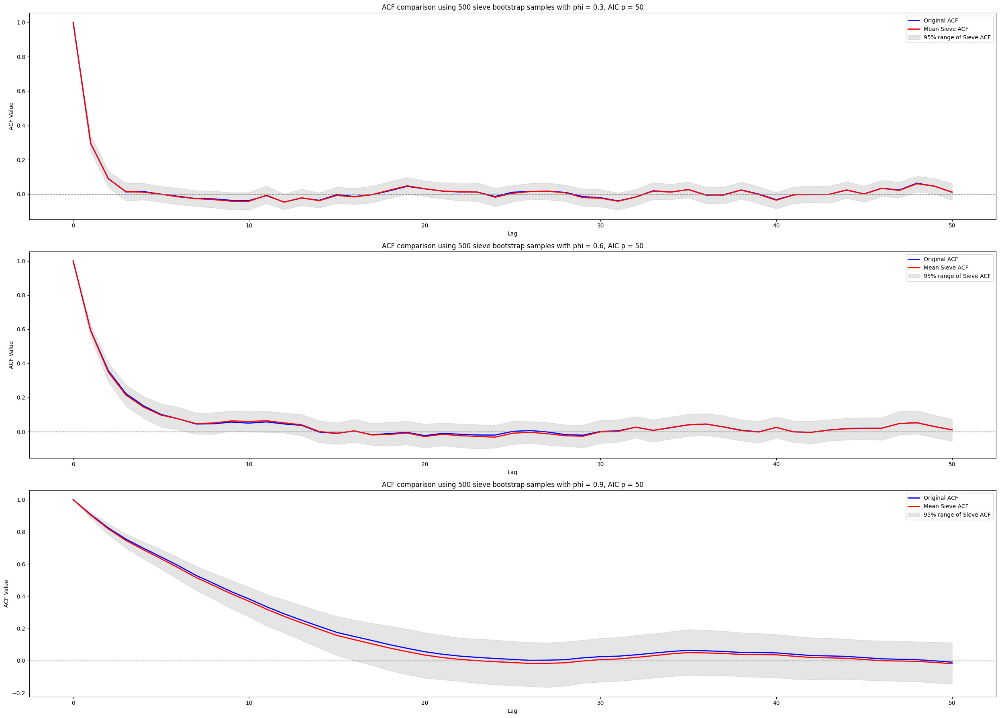

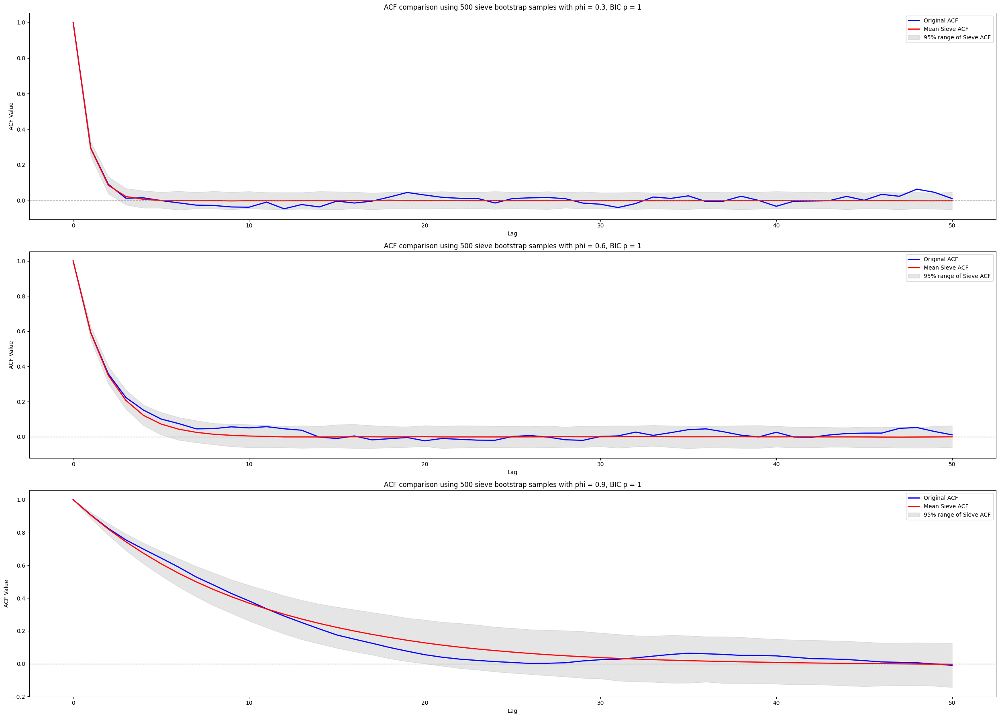

In [27]:
maxLag = 50
lags = np.arange(maxLag + 1)

for criterion, selectedOrders in orderChoices.items():

  fig, axes = plt.subplots(3, 1, figsize = (25, 18))

  #Comparing the acf of original and synthetic for each series and block
  for i, name in enumerate(phiNames):
    original = originalSeries[name]
    samples = SIEVEsamplesAll[criterion][name]

    p = selectedOrders[name]

    originalACF = acf_values(original, maxLag = maxLag)
    samplesACF = compute_acf_for_samples(samples, maxLag = maxLag)

    #Percentile, not a critical value of confidence interval
    meanACF = np.mean(samplesACF, axis=0)
    lowerACF = np.percentile(samplesACF, 2.5, axis=0)
    upperACF = np.percentile(samplesACF, 97.5, axis=0)

    axes[i].plot(lags, originalACF, color = 'blue', linewidth = 2, label = 'Original ACF')
    axes[i].plot(lags, meanACF, color = 'red', linewidth = 2, label = 'Mean Sieve ACF')
    #95% range
    axes[i].fill_between(lags, lowerACF, upperACF, color = 'gray', alpha = 0.2, label = '95% range of Sieve ACF')

    axes[i].axhline(0, color = 'gray', linestyle = '--', linewidth = 1)
    axes[i].set_title(f'ACF comparison using 500 sieve bootstrap samples with {name}, {criterion} p = {p}')
    axes[i].set_xlabel('Lag')
    axes[i].set_ylabel('ACF Value')
    axes[i].legend(loc = 'upper right')

  plt.tight_layout()
  plt.show()

In [28]:
rows = []

for criterion, selectedOrders in orderChoices.items():

  for name, original in originalSeries.items():

    samples = SIEVEsamplesAll[criterion][name]
    p = selectedOrders[name]

    meanErrors = []
    varianceErrors = []
    acfErrors = []

    for sample in samples:
      meanErrors.append(mean_error(original, sample))
      varianceErrors.append(variance_error(original, sample))
      acfErrors.append(acf_error(original, sample, maxLag = maxLag))

    meanACF, acfCI = monte_carlo_ci(acfErrors)
    meanMeanError, meanErrorCI = monte_carlo_ci(meanErrors)
    meanVarianceError, varianceErrorCI = monte_carlo_ci(varianceErrors)

    # The table of results
    rows.append({
        "Method": "Sieve Bootstrap",
        "Tuning": f"p = {p} selected by {criterion}",
        "Series": f'AR(1) with {name}',
        "mean_acf_error": meanACF,
        "acf_error_95ci": acfCI,
        "mean_error_mean": meanMeanError,
        "mean_error_95ci": meanErrorCI,
        "variance_error_mean": meanVarianceError,
        "variance_error_95ci": varianceErrorCI
    })

SieveSummary = pd.DataFrame(rows)

SieveSummary

,Method,Tuning,Series,mean_acf_error,acf_error_95ci,mean_error_mean,mean_error_95ci,variance_error_mean,variance_error_95ci
0,Sieve Bootstrap,p = 50 selected by AIC,AR(1) with phi = 0.3,0.0313,"[0.0305, 0.0321]",0.0263,"[0.0246, 0.028]",0.0319,"[0.0299, 0.034]"
1,Sieve Bootstrap,p = 50 selected by AIC,AR(1) with phi = 0.6,0.0548,"[0.0524, 0.0573]",0.0517,"[0.0483, 0.0552]",0.0565,"[0.0529, 0.0602]"
2,Sieve Bootstrap,p = 50 selected by AIC,AR(1) with phi = 0.9,0.2037,"[0.1865, 0.2209]",0.1965,"[0.1838, 0.2092]",0.4469,"[0.4168, 0.4771]"
3,Sieve Bootstrap,p = 1 selected by BIC,AR(1) with phi = 0.3,0.0568,"[0.0556, 0.058]",0.0260,"[0.0242, 0.0277]",0.0324,"[0.0302, 0.0346]"
4,Sieve Bootstrap,p = 1 selected by BIC,AR(1) with phi = 0.6,0.0817,"[0.079, 0.0843]",0.0409,"[0.0381, 0.0436]",0.0547,"[0.051, 0.0583]"
5,Sieve Bootstrap,p = 1 selected by BIC,AR(1) with phi = 0.9,0.2816,"[0.2615, 0.3016]",0.2049,"[0.1913, 0.2184]",0.4635,"[0.4304, 0.4966]"


TimeGAN part

In [29]:
#importing libraries from timegan_utils.py
importlib.reload(timegan_utils)

from timegan_utils import (create_windows, train_timegan_for_series, generate_timegan_samples, timegan_diagnostics, mean_error, variance_error, acf_error)

In [30]:
def run_timegan_experiment(experimentName, seriesName, series, settings, outputlength, seed = 0):
    #Avoiding changing the original dictionary
    settings = settings.copy()

    seqLenCurrent = settings["seqLen"]
    scalerType = settings.pop("scalerType", "standard")

    #Using a function defined in timegan_utils.py. Scaling the series and creating windows
    windows, scaler = create_windows(series, seqLen=seqLenCurrent, scalerType=scalerType)

    #Storing the current windows and scaler in dictionaries
    TimeGANdataCurrent = {seriesName: windows}
    TimeGANscalersCurrent = {seriesName: scaler}

    models, losses, syntheticSeries = train_timegan_for_series(
        name = seriesName, TimeGANdata = TimeGANdataCurrent, TimeGANscalers = TimeGANscalersCurrent,
        outputlength = outputlength, seed = seed, **settings)

    result = {
        "experimentName": experimentName,
        "seriesName": seriesName,
        "settings": settings,
        "scalerType": scalerType,
        "windows": windows,
        "scaler": scaler,
        "models": models,
        "losses": losses,
        "syntheticSeries": syntheticSeries
    }

    return result

In [31]:
timeganOriginalSeries = {}

for name, series in originalSeries.items():
  timeganOriginalSeries[f'AR(1) with {name}'] = series

timeganOriginalSeries.keys()

dict_keys(['AR(1) with phi = 0.3', 'AR(1) with phi = 0.6', 'AR(1) with phi = 0.9'])

In [32]:
baseTimeGANSettings = {
    "seqLen": 50,
    "scalerType": "standard",
    "hiddenDim": 12,
    "numLayers": 1,
    "zDim": 5,
    "batchSize": 128,
    "pretrainIterations": 1000,
    "supervisorIterations": 1000,
    "jointIterations": 2000,
    "noiseType": "normal",
    "latentActivation": "tanh",
    "recoveryActivation": None,
    "supervisedWeight": 10,
    "momentWeight": 1,
    "gamma": 1
}

In [33]:
timeganResults = {}

#Training with baseline TimeGAN settings
for name, series in timeganOriginalSeries.items():
    print("=" * 60)
    print("Training main TimeGAN for", name)
    print("=" * 60)

    result = run_timegan_experiment(
        experimentName = "main",
        seriesName = name,
        series=series,
        settings = baseTimeGANSettings,
        outputlength = n,
        seed = 0
    )

    timeganResults[("main", name)] = result

Training main TimeGAN for AR(1) with phi = 0.3
Embedder iteration 0, loss: 1.074624
Embedder iteration 100, loss: 0.047781
Embedder iteration 200, loss: 0.009000
Embedder iteration 300, loss: 0.004865
Embedder iteration 400, loss: 0.002143
Embedder iteration 500, loss: 0.001415
Embedder iteration 600, loss: 0.000862
Embedder iteration 700, loss: 0.001235
Embedder iteration 800, loss: 0.000975
Embedder iteration 900, loss: 0.000680
Supervisor iteration 0, loss: 0.393771
Supervisor iteration 100, loss: 0.111613
Supervisor iteration 200, loss: 0.049556
Supervisor iteration 300, loss: 0.036461
Supervisor iteration 400, loss: 0.031619
Supervisor iteration 500, loss: 0.030979
Supervisor iteration 600, loss: 0.029624
Supervisor iteration 700, loss: 0.028971
Supervisor iteration 800, loss: 0.028392
Supervisor iteration 900, loss: 0.028238
Joint iteration 0, G loss: 3.8850, E loss: 0.2031, D loss: 2.3893
Joint iteration 100, G loss: 4.5666, E loss: 0.1458, D loss: 1.0639
Joint iteration 200, G 

In [34]:
for name in timeganOriginalSeries.keys():
    result = timeganResults[("main", name)]

    print("=" * 60)
    print(name)
    print("=" * 60)

    #Checking the dependencies of synthetic time series
    timegan_diagnostics(
        timeganOriginalSeries[name],
        result["syntheticSeries"],
        maxLag = maxLag
    )

AR(1) with phi = 0.3
Original mean: 0.04575699760134527
Synthetic mean: 0.018287834

Original std: 1.0516709600709857
Synthetic std: 0.9952833

Original variance: 1.1060118082566286
Synthetic variance: 0.9905889

Original min/max: -3.399272347869738 3.6531774832494133
Synthetic min/max: -1.7354734 2.8736649

Original lag 1 ACF: 0.2938720303812602
Synthetic lag 1 ACF: 0.2137353134732154
ACF error: 0.07934318091690035
AR(1) with phi = 0.6
Original mean: -0.024106201982752918
Synthetic mean: 0.10078414

Original std: 1.2292459907767204
Synthetic std: 1.1699736

Original variance: 1.511045705840641
Synthetic variance: 1.3688383

Original min/max: -3.429376417293008 4.929416448533672
Synthetic min/max: -3.009255 3.0956483

Original lag 1 ACF: 0.5923840808006372
Synthetic lag 1 ACF: 0.6992529772018528
ACF error: 0.1758073382142571
AR(1) with phi = 0.9
Original mean: 0.12865097629665143
Synthetic mean: 0.18450873

Original std: 2.4017157981706703
Synthetic std: 2.3392408

Original variance: 5

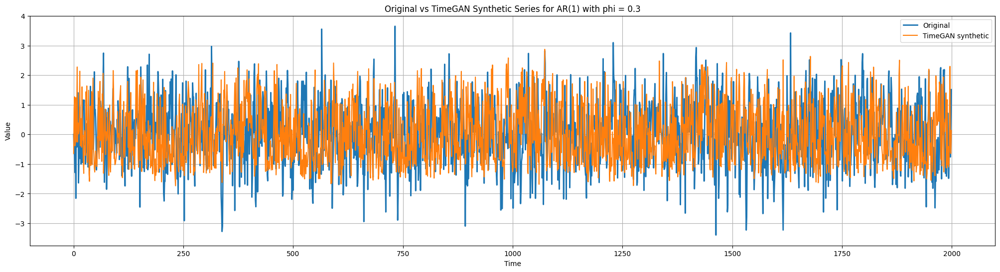

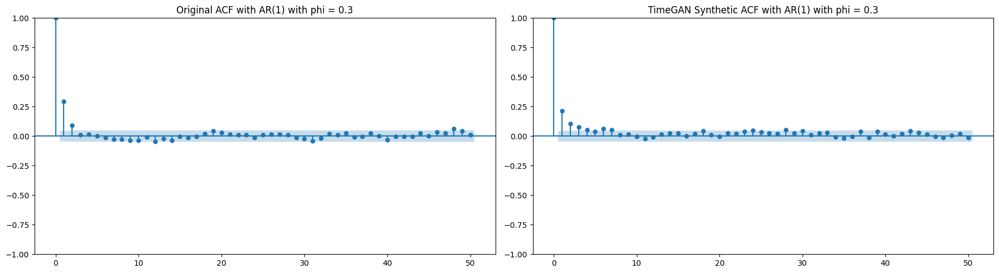

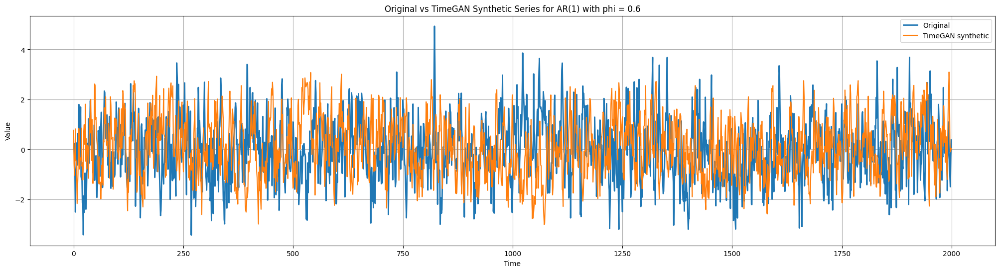

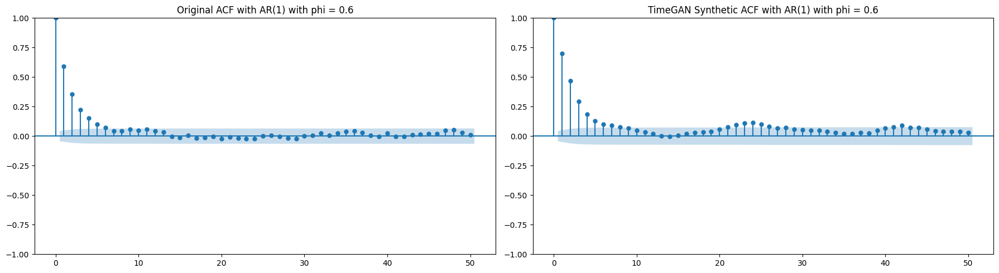

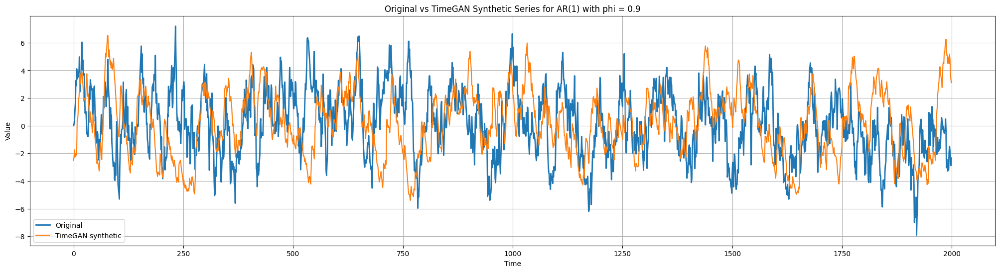

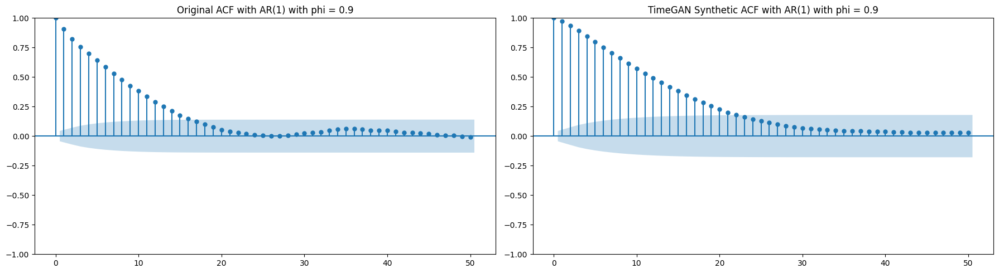

In [35]:
for name in timeganOriginalSeries.keys():
    #Extracting one generated synthetic time series for each phi
    result = timeganResults[("main", name)]
    syntheticSeries = result["syntheticSeries"]

    #Plotting the synthetic series over original one
    plt.figure(figsize = (25, 6))
    plt.plot(timeganOriginalSeries[name], linewidth = 2, label = "Original")
    plt.plot(syntheticSeries, linewidth = 1.5, label = "TimeGAN synthetic")

    plt.xlabel("Time")
    plt.ylabel("Value")
    plt.title(f"Original vs TimeGAN Synthetic Series for {name}")
    plt.legend()
    plt.grid(True)
    plt.show()

    fig, axes = plt.subplots(1, 2, figsize = (18, 5))

    #ACF plot
    plot_acf(timeganOriginalSeries[name], ax = axes[0], lags = 50)
    axes[0].set_title(f"Original ACF with {name}")

    plot_acf(syntheticSeries, ax = axes[1], lags = 50)
    axes[1].set_title(f"TimeGAN Synthetic ACF with {name}")

    plt.tight_layout()
    plt.show()

In [36]:
def try_timegan_setting(seriesName, experimentName, updates=None, seed=0):
    #Use the baseline setting if updates is not specified
    if updates is None:
        updates = {}

    settings = baseTimeGANSettings.copy()
    settings.update(updates)

    #Displaying the changed setting
    print("=" * 60)
    print(f"Training {experimentName} for {seriesName}")
    print(settings)
    print("=" * 60)

    result = run_timegan_experiment(
        experimentName = experimentName, seriesName = seriesName,
        series = timeganOriginalSeries[seriesName],
        settings = settings, outputlength = n,
        seed = seed
    )

    timeganResults[(experimentName, seriesName)] = result

    print()
    #Displaying the statistical results
    timegan_diagnostics(
        timeganOriginalSeries[seriesName],
        result["syntheticSeries"],
        maxLag = maxLag
    )

    syntheticSeries = result["syntheticSeries"]

    #Plotting the synthetic, original, acf
    plt.figure(figsize=(25, 6))
    plt.plot(timeganOriginalSeries[seriesName], linewidth=2, label="Original")
    plt.plot(syntheticSeries, linewidth=1.5, label="TimeGAN synthetic")
    plt.xlabel("Time")
    plt.ylabel("Value")
    plt.title(f"{experimentName}: Original vs TimeGAN Synthetic Series for {seriesName}")
    plt.legend()
    plt.grid(True)
    plt.show()

    fig, axes = plt.subplots(1, 2, figsize=(18, 5))

    plot_acf(timeganOriginalSeries[seriesName], ax=axes[0], lags=maxLag)
    axes[0].set_title(f"Original ACF with {seriesName}")

    plot_acf(syntheticSeries, ax=axes[1], lags=maxLag)
    axes[1].set_title(f"{experimentName} TimeGAN ACF with {seriesName}")

    plt.tight_layout()
    plt.show()

Hyperparameter Tuning

Training seq100 for AR(1) with phi = 0.9
{'seqLen': 100, 'scalerType': 'standard', 'hiddenDim': 12, 'numLayers': 1, 'zDim': 5, 'batchSize': 128, 'pretrainIterations': 1000, 'supervisorIterations': 1000, 'jointIterations': 2000, 'noiseType': 'normal', 'latentActivation': 'tanh', 'recoveryActivation': None, 'supervisedWeight': 10, 'momentWeight': 1, 'gamma': 1}
Embedder iteration 0, loss: 0.900326
Embedder iteration 100, loss: 0.083184
Embedder iteration 200, loss: 0.008635
Embedder iteration 300, loss: 0.003245
Embedder iteration 400, loss: 0.002221
Embedder iteration 500, loss: 0.001186
Embedder iteration 600, loss: 0.000905
Embedder iteration 700, loss: 0.000941
Embedder iteration 800, loss: 0.000629
Embedder iteration 900, loss: 0.000451
Supervisor iteration 0, loss: 0.360767
Supervisor iteration 100, loss: 0.083214
Supervisor iteration 200, loss: 0.032315
Supervisor iteration 300, loss: 0.021973
Supervisor iteration 400, loss: 0.016749
Supervisor iteration 500, loss: 0.013299
Superv

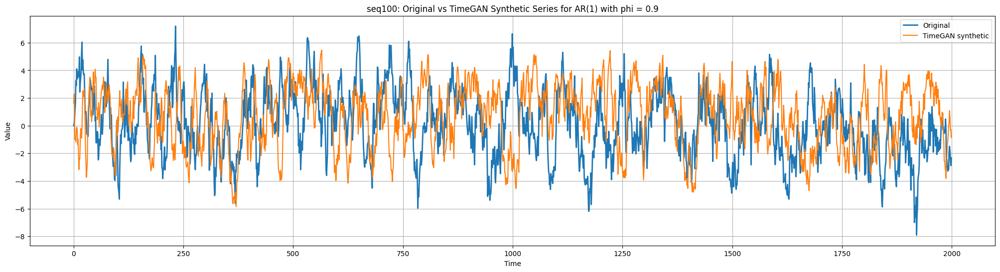

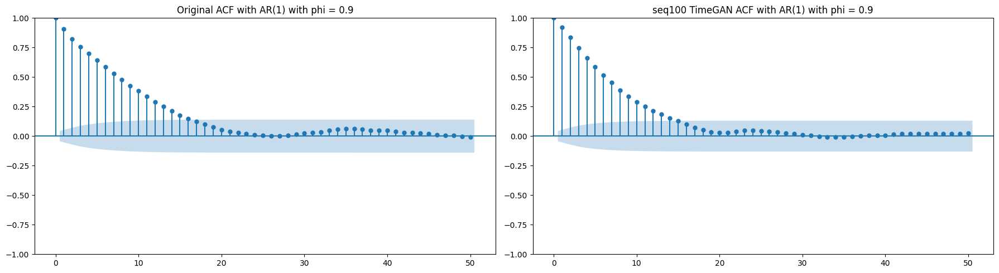

In [104]:
try_timegan_setting(
    seriesName = 'AR(1) with phi = 0.9',
    experimentName = 'seq100',
    updates = {
        'seqLen': 100
    }
)

Training sw15 for AR(1) with phi = 0.3
{'seqLen': 50, 'scalerType': 'standard', 'hiddenDim': 12, 'numLayers': 1, 'zDim': 5, 'batchSize': 128, 'pretrainIterations': 1000, 'supervisorIterations': 1000, 'jointIterations': 2000, 'noiseType': 'normal', 'latentActivation': 'tanh', 'recoveryActivation': None, 'supervisedWeight': 15, 'momentWeight': 1, 'gamma': 1}
Embedder iteration 0, loss: 1.027965
Embedder iteration 100, loss: 0.030692
Embedder iteration 200, loss: 0.012198
Embedder iteration 300, loss: 0.005019
Embedder iteration 400, loss: 0.002008
Embedder iteration 500, loss: 0.001288
Embedder iteration 600, loss: 0.000748
Embedder iteration 700, loss: 0.001203
Embedder iteration 800, loss: 0.000951
Embedder iteration 900, loss: 0.000716
Supervisor iteration 0, loss: 0.414913
Supervisor iteration 100, loss: 0.109391
Supervisor iteration 200, loss: 0.050369
Supervisor iteration 300, loss: 0.039889
Supervisor iteration 400, loss: 0.035418
Supervisor iteration 500, loss: 0.035394
Superviso

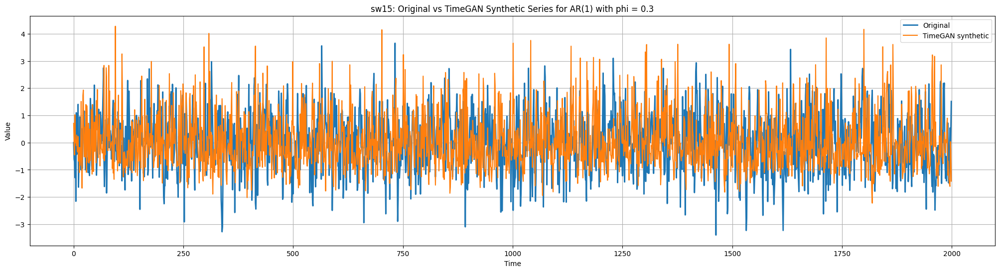

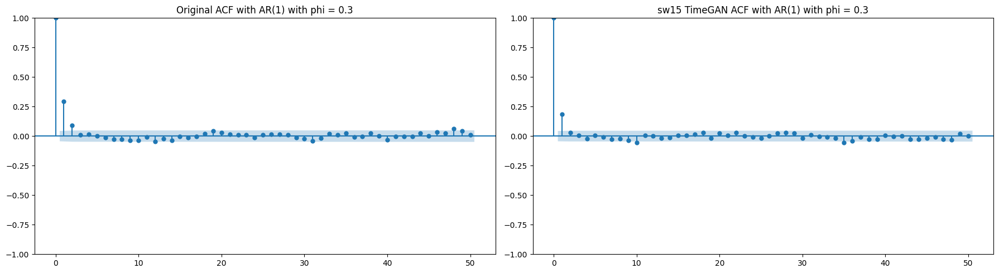

In [65]:
try_timegan_setting(
    seriesName = "AR(1) with phi = 0.3",
    experimentName="sw15",
    updates={
        "supervisedWeight": 15
    }
)

Training sw5 for AR(1) with phi = 0.6
{'seqLen': 50, 'scalerType': 'standard', 'hiddenDim': 12, 'numLayers': 1, 'zDim': 5, 'batchSize': 128, 'pretrainIterations': 1000, 'supervisorIterations': 1000, 'jointIterations': 2000, 'noiseType': 'normal', 'latentActivation': 'tanh', 'recoveryActivation': None, 'supervisedWeight': 5, 'momentWeight': 1, 'gamma': 1}
Embedder iteration 0, loss: 1.021910
Embedder iteration 100, loss: 0.051954
Embedder iteration 200, loss: 0.012335
Embedder iteration 300, loss: 0.004348
Embedder iteration 400, loss: 0.002248
Embedder iteration 500, loss: 0.001656
Embedder iteration 600, loss: 0.001366
Embedder iteration 700, loss: 0.001047
Embedder iteration 800, loss: 0.000859
Embedder iteration 900, loss: 0.001024
Supervisor iteration 0, loss: 0.375071
Supervisor iteration 100, loss: 0.121780
Supervisor iteration 200, loss: 0.050784
Supervisor iteration 300, loss: 0.034026
Supervisor iteration 400, loss: 0.028303
Supervisor iteration 500, loss: 0.026169
Supervisor 

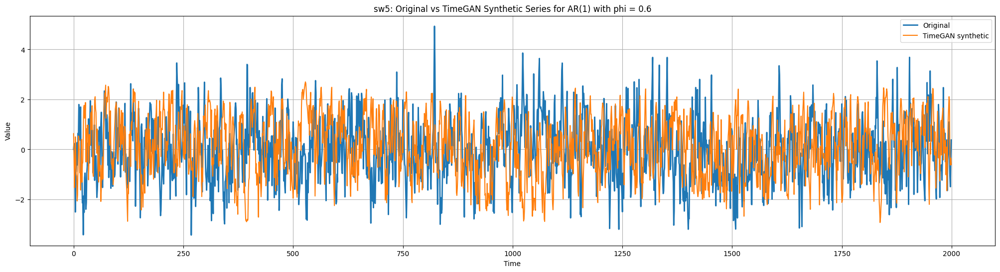

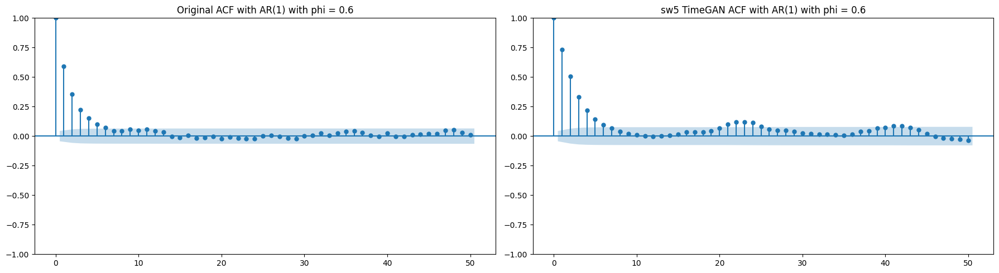

In [66]:
try_timegan_setting(
    seriesName = "AR(1) with phi = 0.6",
    experimentName = 'sw5',
    updates = {
        'supervisedWeight': 5
    }
)

Training sw5 for AR(1) with phi = 0.9
{'seqLen': 50, 'scalerType': 'standard', 'hiddenDim': 12, 'numLayers': 1, 'zDim': 5, 'batchSize': 128, 'pretrainIterations': 1000, 'supervisorIterations': 1000, 'jointIterations': 2000, 'noiseType': 'normal', 'latentActivation': 'tanh', 'recoveryActivation': None, 'supervisedWeight': 5, 'momentWeight': 1, 'gamma': 1}
Embedder iteration 0, loss: 0.922289
Embedder iteration 100, loss: 0.123285
Embedder iteration 200, loss: 0.013292
Embedder iteration 300, loss: 0.004981
Embedder iteration 400, loss: 0.003345
Embedder iteration 500, loss: 0.002007
Embedder iteration 600, loss: 0.001165
Embedder iteration 700, loss: 0.000860
Embedder iteration 800, loss: 0.001001
Embedder iteration 900, loss: 0.000725
Supervisor iteration 0, loss: 0.695211
Supervisor iteration 100, loss: 0.182004
Supervisor iteration 200, loss: 0.040982
Supervisor iteration 300, loss: 0.019057
Supervisor iteration 400, loss: 0.014315
Supervisor iteration 500, loss: 0.011258
Supervisor 

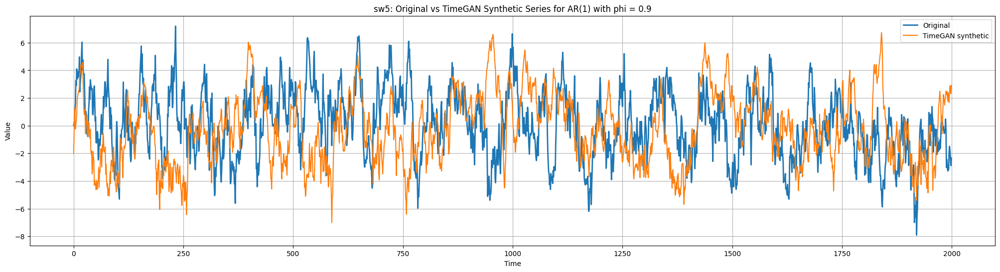

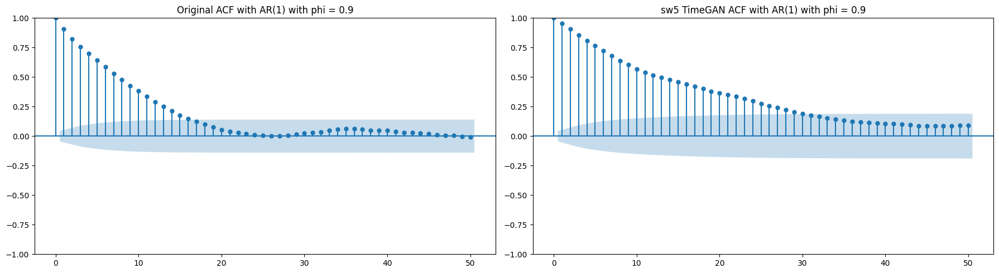

In [105]:
try_timegan_setting(
    seriesName = "AR(1) with phi = 0.9",
    experimentName = 'sw5',
    updates = {
        'supervisedWeight': 5
    }
)

Training seq100_sw5 for AR(1) with phi = 0.3
{'seqLen': 100, 'scalerType': 'standard', 'hiddenDim': 12, 'numLayers': 1, 'zDim': 5, 'batchSize': 128, 'pretrainIterations': 1000, 'supervisorIterations': 1000, 'jointIterations': 2000, 'noiseType': 'normal', 'latentActivation': 'tanh', 'recoveryActivation': None, 'supervisedWeight': 5, 'momentWeight': 1, 'gamma': 1}
Embedder iteration 0, loss: 0.966092
Embedder iteration 100, loss: 0.031491
Embedder iteration 200, loss: 0.007548
Embedder iteration 300, loss: 0.002343
Embedder iteration 400, loss: 0.001278
Embedder iteration 500, loss: 0.000918
Embedder iteration 600, loss: 0.000797
Embedder iteration 700, loss: 0.000608
Embedder iteration 800, loss: 0.000634
Embedder iteration 900, loss: 0.000581
Supervisor iteration 0, loss: 0.481034
Supervisor iteration 100, loss: 0.160825
Supervisor iteration 200, loss: 0.066287
Supervisor iteration 300, loss: 0.049322
Supervisor iteration 400, loss: 0.043726
Supervisor iteration 500, loss: 0.041615
Sup

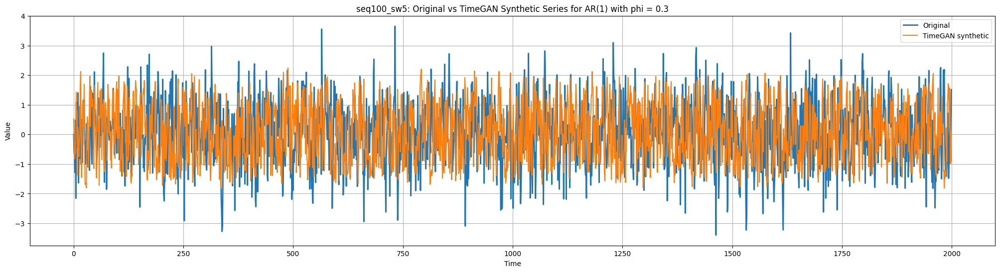

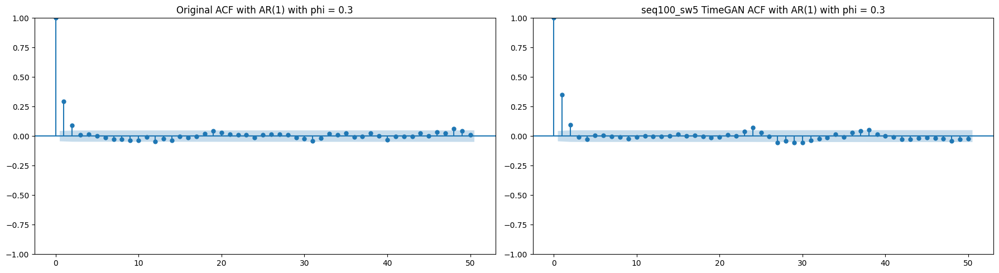

In [68]:
try_timegan_setting(
    seriesName = "AR(1) with phi = 0.3",
    experimentName = 'seq100_sw5',
    updates = {
        'seqLen': 100,
        'supervisedWeight': 5
    }
)

Training seq100_sw15_zDim10 for AR(1) with phi = 0.6
{'seqLen': 100, 'scalerType': 'standard', 'hiddenDim': 12, 'numLayers': 1, 'zDim': 10, 'batchSize': 128, 'pretrainIterations': 1000, 'supervisorIterations': 1000, 'jointIterations': 2000, 'noiseType': 'normal', 'latentActivation': 'tanh', 'recoveryActivation': None, 'supervisedWeight': 15, 'momentWeight': 1, 'gamma': 1}
Embedder iteration 0, loss: 1.178271
Embedder iteration 100, loss: 0.079927
Embedder iteration 200, loss: 0.010150
Embedder iteration 300, loss: 0.004405
Embedder iteration 400, loss: 0.002347
Embedder iteration 500, loss: 0.001426
Embedder iteration 600, loss: 0.001012
Embedder iteration 700, loss: 0.000948
Embedder iteration 800, loss: 0.000762
Embedder iteration 900, loss: 0.000560
Supervisor iteration 0, loss: 0.637179
Supervisor iteration 100, loss: 0.201130
Supervisor iteration 200, loss: 0.075202
Supervisor iteration 300, loss: 0.048855
Supervisor iteration 400, loss: 0.039166
Supervisor iteration 500, loss: 0.

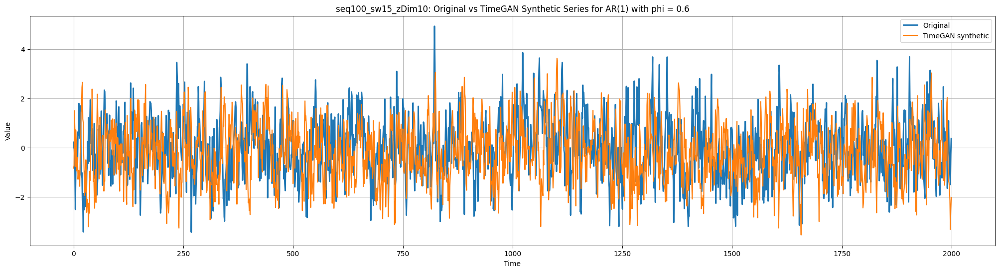

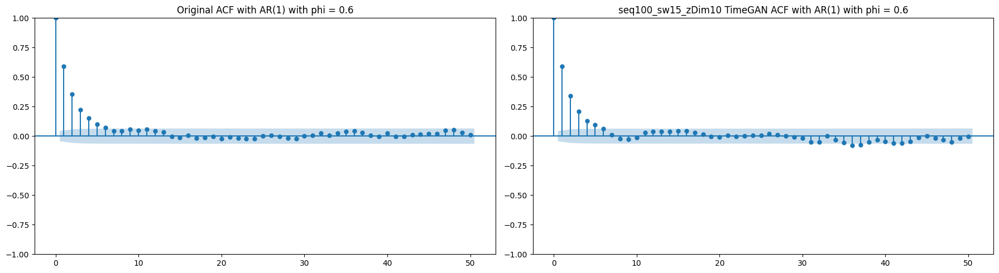

In [69]:
try_timegan_setting(
    seriesName = "AR(1) with phi = 0.6",
    experimentName = "seq100_sw15_zDim10",
    updates = {
        "seqLen": 100,
        "supervisedWeight": 15,
        "zDim": 10
    }
)

Training zDim10 for AR(1) with phi = 0.9
{'seqLen': 50, 'scalerType': 'standard', 'hiddenDim': 12, 'numLayers': 1, 'zDim': 10, 'batchSize': 128, 'pretrainIterations': 1000, 'supervisorIterations': 1000, 'jointIterations': 2000, 'noiseType': 'normal', 'latentActivation': 'tanh', 'recoveryActivation': None, 'supervisedWeight': 10, 'momentWeight': 1, 'gamma': 1}
Embedder iteration 0, loss: 1.144357
Embedder iteration 100, loss: 0.136676
Embedder iteration 200, loss: 0.020925
Embedder iteration 300, loss: 0.007023
Embedder iteration 400, loss: 0.004010
Embedder iteration 500, loss: 0.002153
Embedder iteration 600, loss: 0.001188
Embedder iteration 700, loss: 0.000885
Embedder iteration 800, loss: 0.000860
Embedder iteration 900, loss: 0.000673
Supervisor iteration 0, loss: 0.376298
Supervisor iteration 100, loss: 0.101912
Supervisor iteration 200, loss: 0.038607
Supervisor iteration 300, loss: 0.018330
Supervisor iteration 400, loss: 0.012532
Supervisor iteration 500, loss: 0.009473
Superv

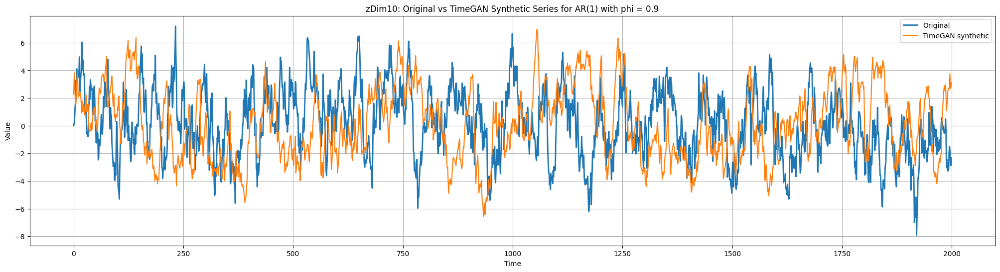

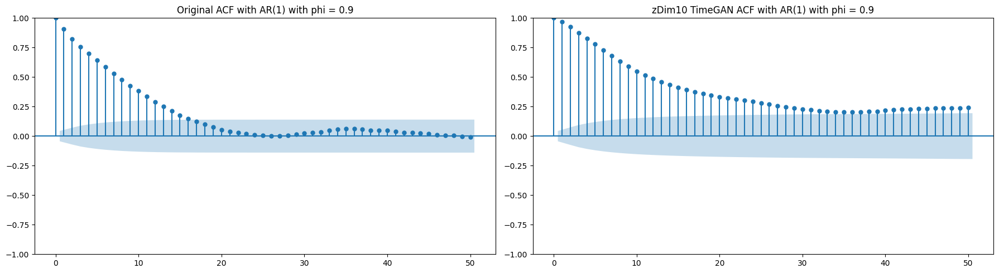

In [106]:
try_timegan_setting(
    seriesName = "AR(1) with phi = 0.9",
    experimentName = "zDim10",
    updates = {
        "zDim": 10
    }
)

Training sw15_zDim10 for AR(1) with phi = 0.3
{'seqLen': 50, 'scalerType': 'standard', 'hiddenDim': 12, 'numLayers': 1, 'zDim': 10, 'batchSize': 128, 'pretrainIterations': 1000, 'supervisorIterations': 1000, 'jointIterations': 2000, 'noiseType': 'normal', 'latentActivation': 'tanh', 'recoveryActivation': None, 'supervisedWeight': 15, 'momentWeight': 1, 'gamma': 1}
Embedder iteration 0, loss: 1.131492
Embedder iteration 100, loss: 0.052800
Embedder iteration 200, loss: 0.012374
Embedder iteration 300, loss: 0.005195
Embedder iteration 400, loss: 0.002064
Embedder iteration 500, loss: 0.001234
Embedder iteration 600, loss: 0.000787
Embedder iteration 700, loss: 0.001140
Embedder iteration 800, loss: 0.000930
Embedder iteration 900, loss: 0.000634
Supervisor iteration 0, loss: 0.376391
Supervisor iteration 100, loss: 0.099107
Supervisor iteration 200, loss: 0.045037
Supervisor iteration 300, loss: 0.036021
Supervisor iteration 400, loss: 0.032676
Supervisor iteration 500, loss: 0.032412
S

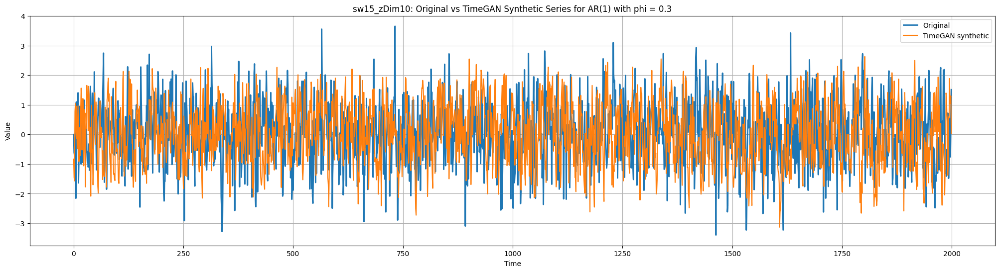

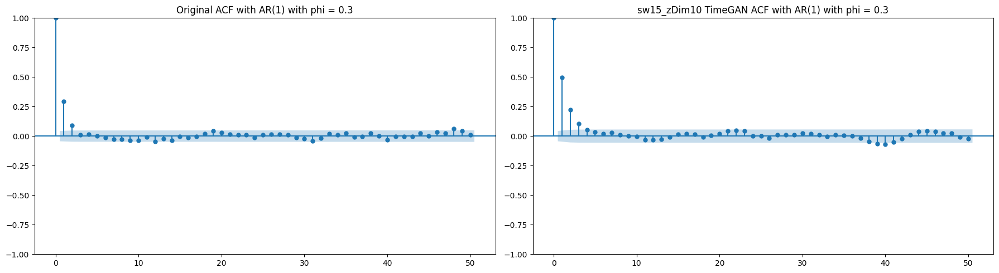

In [71]:
try_timegan_setting(
    seriesName = "AR(1) with phi = 0.3",
    experimentName = "sw15_zDim10",
    updates = {
        "supervisedWeight": 15,
        "zDim": 10
    }
)

Training seq100_zDim10 for AR(1) with phi = 0.3
{'seqLen': 100, 'scalerType': 'standard', 'hiddenDim': 12, 'numLayers': 1, 'zDim': 10, 'batchSize': 128, 'pretrainIterations': 1000, 'supervisorIterations': 1000, 'jointIterations': 2000, 'noiseType': 'normal', 'latentActivation': 'tanh', 'recoveryActivation': None, 'supervisedWeight': 10, 'momentWeight': 1, 'gamma': 1}
Embedder iteration 0, loss: 1.009235
Embedder iteration 100, loss: 0.028367
Embedder iteration 200, loss: 0.014248
Embedder iteration 300, loss: 0.005926
Embedder iteration 400, loss: 0.002065
Embedder iteration 500, loss: 0.001244
Embedder iteration 600, loss: 0.000958
Embedder iteration 700, loss: 0.000716
Embedder iteration 800, loss: 0.000684
Embedder iteration 900, loss: 0.000617
Supervisor iteration 0, loss: 0.601068
Supervisor iteration 100, loss: 0.196448
Supervisor iteration 200, loss: 0.060886
Supervisor iteration 300, loss: 0.037848
Supervisor iteration 400, loss: 0.030679
Supervisor iteration 500, loss: 0.02742

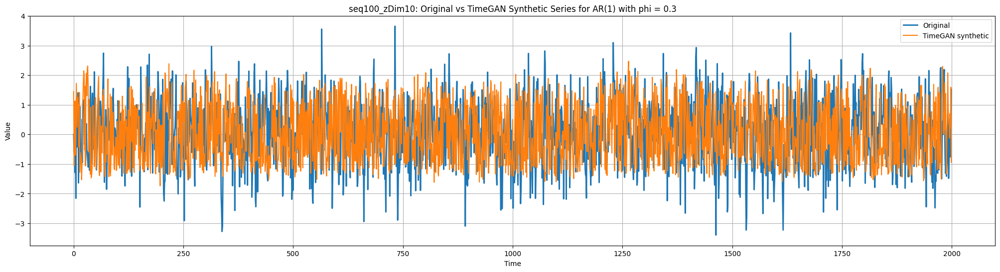

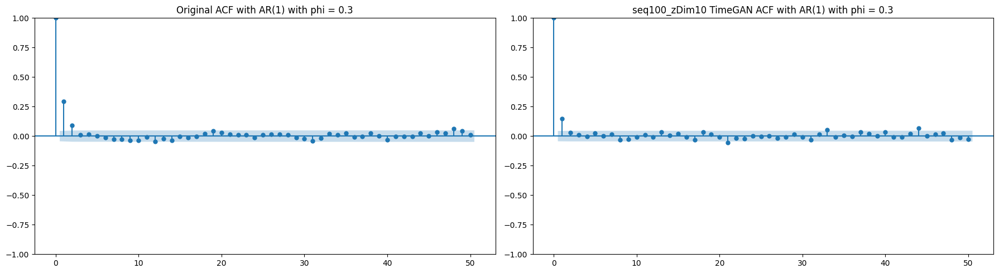

In [72]:
try_timegan_setting(
    seriesName = "AR(1) with phi = 0.3",
    experimentName = "seq100_zDim10",
    updates = {
        "seqLen": 100,
        "zDim": 10
    }
)

Training sw2 for AR(1) with phi = 0.3
{'seqLen': 50, 'scalerType': 'standard', 'hiddenDim': 12, 'numLayers': 1, 'zDim': 5, 'batchSize': 128, 'pretrainIterations': 1000, 'supervisorIterations': 1000, 'jointIterations': 2000, 'noiseType': 'normal', 'latentActivation': 'tanh', 'recoveryActivation': None, 'supervisedWeight': 2, 'momentWeight': 1, 'gamma': 1}
Embedder iteration 0, loss: 0.994919
Embedder iteration 100, loss: 0.051975
Embedder iteration 200, loss: 0.016146
Embedder iteration 300, loss: 0.006432
Embedder iteration 400, loss: 0.002499
Embedder iteration 500, loss: 0.001511
Embedder iteration 600, loss: 0.000940
Embedder iteration 700, loss: 0.001382
Embedder iteration 800, loss: 0.001115
Embedder iteration 900, loss: 0.000730
Supervisor iteration 0, loss: 0.367484
Supervisor iteration 100, loss: 0.134823
Supervisor iteration 200, loss: 0.059752
Supervisor iteration 300, loss: 0.045295
Supervisor iteration 400, loss: 0.039446
Supervisor iteration 500, loss: 0.038794
Supervisor 

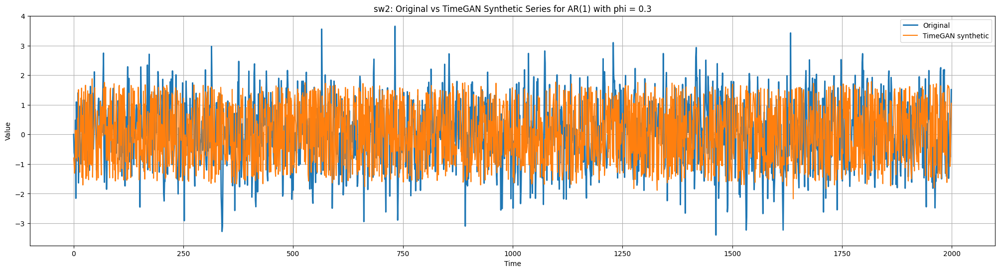

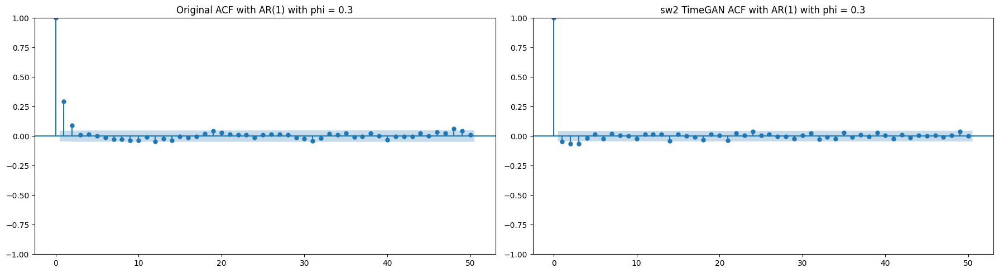

In [73]:
try_timegan_setting(
    seriesName = "AR(1) with phi = 0.3",
    experimentName = "sw2",
    updates = {
        "supervisedWeight": 2
    }
)

Training sw2 for AR(1) with phi = 0.6
{'seqLen': 50, 'scalerType': 'standard', 'hiddenDim': 12, 'numLayers': 1, 'zDim': 5, 'batchSize': 128, 'pretrainIterations': 1000, 'supervisorIterations': 1000, 'jointIterations': 2000, 'noiseType': 'normal', 'latentActivation': 'tanh', 'recoveryActivation': None, 'supervisedWeight': 2, 'momentWeight': 1, 'gamma': 1}
Embedder iteration 0, loss: 1.220947
Embedder iteration 100, loss: 0.078829
Embedder iteration 200, loss: 0.015029
Embedder iteration 300, loss: 0.009593
Embedder iteration 400, loss: 0.005716
Embedder iteration 500, loss: 0.002899
Embedder iteration 600, loss: 0.001512
Embedder iteration 700, loss: 0.001006
Embedder iteration 800, loss: 0.000741
Embedder iteration 900, loss: 0.000884
Supervisor iteration 0, loss: 0.339171
Supervisor iteration 100, loss: 0.077572
Supervisor iteration 200, loss: 0.028281
Supervisor iteration 300, loss: 0.021527
Supervisor iteration 400, loss: 0.019586
Supervisor iteration 500, loss: 0.018783
Supervisor 

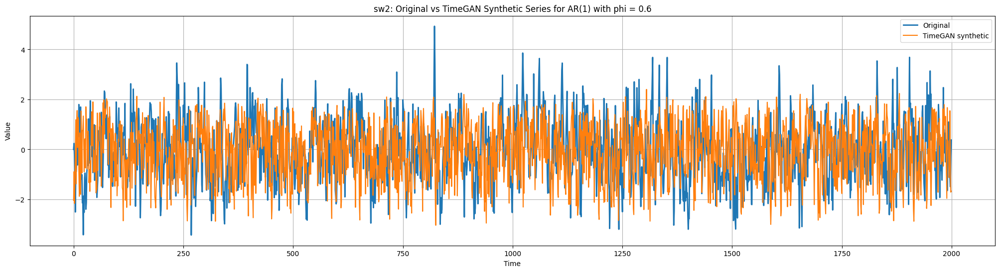

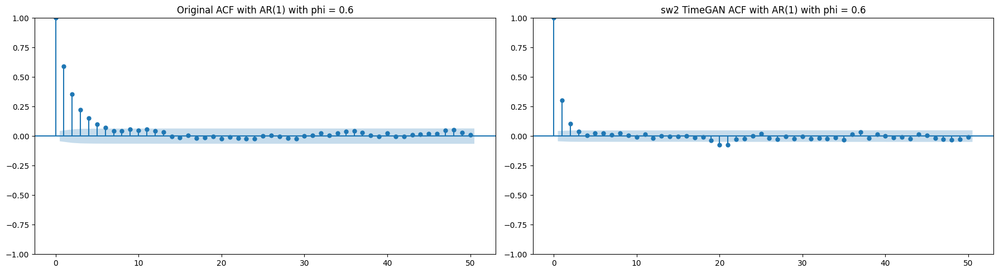

In [74]:
try_timegan_setting(
    seriesName = "AR(1) with phi = 0.6",
    experimentName = "sw2",
    updates = {
        "supervisedWeight": 2
    }
)

Training seq100_hD16 for AR(1) with phi = 0.9
{'seqLen': 100, 'scalerType': 'standard', 'hiddenDim': 16, 'numLayers': 1, 'zDim': 5, 'batchSize': 128, 'pretrainIterations': 1000, 'supervisorIterations': 1000, 'jointIterations': 2000, 'noiseType': 'normal', 'latentActivation': 'tanh', 'recoveryActivation': None, 'supervisedWeight': 10, 'momentWeight': 1, 'gamma': 1}
Embedder iteration 0, loss: 0.766880
Embedder iteration 100, loss: 0.041563
Embedder iteration 200, loss: 0.003565
Embedder iteration 300, loss: 0.001743
Embedder iteration 400, loss: 0.001283
Embedder iteration 500, loss: 0.000607
Embedder iteration 600, loss: 0.000509
Embedder iteration 700, loss: 0.000531
Embedder iteration 800, loss: 0.000371
Embedder iteration 900, loss: 0.000259
Supervisor iteration 0, loss: 0.385874
Supervisor iteration 100, loss: 0.083344
Supervisor iteration 200, loss: 0.023949
Supervisor iteration 300, loss: 0.013686
Supervisor iteration 400, loss: 0.010613
Supervisor iteration 500, loss: 0.009335
S

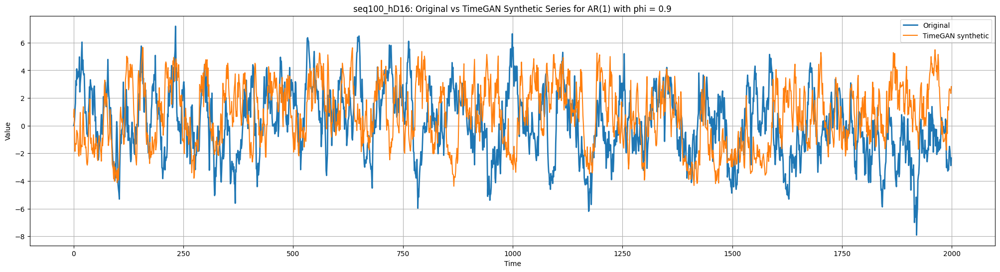

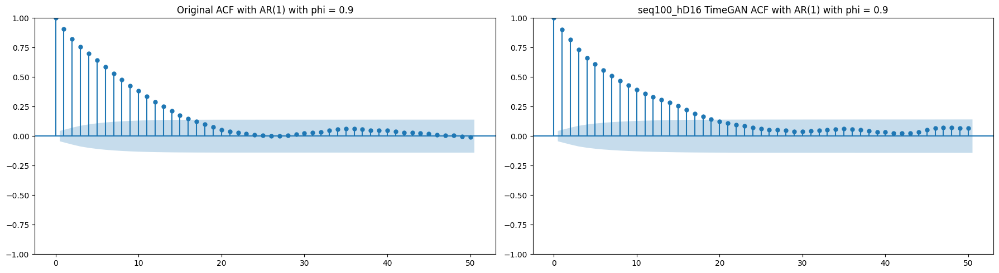

In [107]:
try_timegan_setting(
    seriesName = "AR(1) with phi = 0.9",
    experimentName = "seq100_hD16",
    updates = {
        "seqLen": 100,
        "hiddenDim": 16
    }
)

In [108]:
for key in timeganResults.keys():
    print(key)

('main', 'AR(1) with phi = 0.3')
('main', 'AR(1) with phi = 0.6')
('main', 'AR(1) with phi = 0.9')
('seq100', 'AR(1) with phi = 0.9')
('sw15', 'AR(1) with phi = 0.3')
('sw5', 'AR(1) with phi = 0.6')
('sw5', 'AR(1) with phi = 0.9')
('seq100_sw5', 'AR(1) with phi = 0.3')
('seq100_sw15_zDim10', 'AR(1) with phi = 0.6')
('zDim10', 'AR(1) with phi = 0.9')
('sw15_zDim10', 'AR(1) with phi = 0.3')
('seq100_zDim10', 'AR(1) with phi = 0.3')
('sw2', 'AR(1) with phi = 0.3')
('sw2', 'AR(1) with phi = 0.6')
('seq100_hD16', 'AR(1) with phi = 0.9')


In [109]:
#Extract all defined updates and the main result
timeganCandidateKeys = list(timeganResults.keys())

#Number of monte carlo samples
B = 500
rows = []

TimeGANsamplesAll = {}

for experimentName, seriesName in timeganCandidateKeys:
    print("=" * 60)
    print("Evaluating:", experimentName, seriesName)
    print("=" * 60)

    result = timeganResults[(experimentName, seriesName)]
    settings = result["settings"]

    #Using a function defined in timegan_utils.py to generate samples based on trained model
    samples = generate_timegan_samples(
        models = result["models"],
        scaler = result["scaler"],
        B = B,
        outputlength = n,
        zDim = settings["zDim"],
        noiseType = settings["noiseType"]
    )

    TimeGANsamplesAll[(experimentName, seriesName)] = samples

    original = timeganOriginalSeries[seriesName]

    meanErrors = []
    varianceErrors = []
    acfErrors = []

    for sample in samples:
        meanErrors.append(mean_error(original, sample))
        varianceErrors.append(variance_error(original, sample))
        acfErrors.append(acf_error(original, sample, maxLag=maxLag))


    meanACF, acfCI = monte_carlo_ci(acfErrors)
    meanMeanError, meanErrorCI = monte_carlo_ci(meanErrors)
    meanVarianceError, varianceErrorCI = monte_carlo_ci(varianceErrors)

    #Showing Tuning details and result
    rows.append({
        "Method": "TimeGAN",
        "Experiment": experimentName,
        "Series": seriesName,
        "Tuning": (
            f'seqLen={settings["seqLen"]}, '
            f'h={settings["hiddenDim"]}, '
            f'nL={settings["numLayers"]}, '
            f'z={settings["zDim"]}, '
            f'sw={settings["supervisedWeight"]}, '
            f'mw={settings["momentWeight"]}'
        ),
        "mean_acf_error": meanACF,
        "acf_error_95ci": acfCI,
        "mean_error_mean": meanMeanError,
        "mean_error_95ci": meanErrorCI,
        "variance_error_mean": meanVarianceError,
        "variance_error_95ci": varianceErrorCI
    })

TimeGANTuningSummary = pd.DataFrame(rows)

TimeGANTuningSummary

Evaluating: main AR(1) with phi = 0.3
Evaluating: main AR(1) with phi = 0.6
Evaluating: main AR(1) with phi = 0.9
Evaluating: seq100 AR(1) with phi = 0.9
Evaluating: sw15 AR(1) with phi = 0.3
Evaluating: sw5 AR(1) with phi = 0.6
Evaluating: sw5 AR(1) with phi = 0.9
Evaluating: seq100_sw5 AR(1) with phi = 0.3
Evaluating: seq100_sw15_zDim10 AR(1) with phi = 0.6
Evaluating: zDim10 AR(1) with phi = 0.9
Evaluating: sw15_zDim10 AR(1) with phi = 0.3
Evaluating: seq100_zDim10 AR(1) with phi = 0.3
Evaluating: sw2 AR(1) with phi = 0.3
Evaluating: sw2 AR(1) with phi = 0.6
Evaluating: seq100_hD16 AR(1) with phi = 0.9


,Method,Experiment,Series,Tuning,mean_acf_error,acf_error_95ci,mean_error_mean,mean_error_95ci,variance_error_mean,variance_error_95ci
0,TimeGAN,main,AR(1) with phi = 0.3,"seqLen=50, h=12, nL=1, z=5, sw=10, mw=1",0.0679,"[0.0667, 0.0692]",0.0285,"[0.0268, 0.0303]",0.0719,"[0.0696, 0.0743]"
1,TimeGAN,main,AR(1) with phi = 0.6,"seqLen=50, h=12, nL=1, z=5, sw=10, mw=1",0.1567,"[0.152, 0.1613]",0.0544,"[0.0507, 0.0581]",0.0749,"[0.0704, 0.0793]"
2,TimeGAN,main,AR(1) with phi = 0.9,"seqLen=50, h=12, nL=1, z=5, sw=10, mw=1",2.4950,"[2.3799, 2.6101]",0.3646,"[0.3416, 0.3875]",0.5402,"[0.5046, 0.5758]"
3,TimeGAN,seq100,AR(1) with phi = 0.9,"seqLen=100, h=12, nL=1, z=5, sw=10, mw=1",0.2466,"[0.231, 0.2622]",0.1851,"[0.1732, 0.1971]",0.3848,"[0.3603, 0.4092]"
4,TimeGAN,sw15,AR(1) with phi = 0.3,"seqLen=50, h=12, nL=1, z=5, sw=15, mw=1",0.0740,"[0.0728, 0.0751]",0.0223,"[0.0208, 0.0238]",0.0766,"[0.0732, 0.0799]"
5,TimeGAN,sw5,AR(1) with phi = 0.6,"seqLen=50, h=12, nL=1, z=5, sw=5, mw=1",0.2062,"[0.2009, 0.2116]",0.0606,"[0.0566, 0.0645]",0.0507,"[0.0472, 0.0542]"
6,TimeGAN,sw5,AR(1) with phi = 0.9,"seqLen=50, h=12, nL=1, z=5, sw=5, mw=1",1.4300,"[1.3534, 1.5066]",0.2431,"[0.2265, 0.2597]",0.5364,"[0.5023, 0.5704]"
7,TimeGAN,seq100_sw5,AR(1) with phi = 0.3,"seqLen=100, h=12, nL=1, z=5, sw=5, mw=1",0.0678,"[0.0663, 0.0693]",0.0305,"[0.0285, 0.0325]",0.0786,"[0.0765, 0.0807]"
8,TimeGAN,seq100_sw15_zDim10,AR(1) with phi = 0.6,"seqLen=100, h=12, nL=1, z=10, sw=15, mw=1",0.0791,"[0.0764, 0.0819]",0.0546,"[0.0512, 0.0581]",0.0657,"[0.0615, 0.07]"
9,TimeGAN,zDim10,AR(1) with phi = 0.9,"seqLen=50, h=12, nL=1, z=10, sw=10, mw=1",0.6818,"[0.644, 0.7196]",0.2221,"[0.2074, 0.2368]",0.5050,"[0.4732, 0.5368]"


In [110]:
#Picking the best result based on the mean of acf error for each series
TimeGANBestSummary = (
    TimeGANTuningSummary.sort_values("mean_acf_error")
    .groupby("Series", as_index=False)
    .first()
)

#Results
TimeGANBestSummary = TimeGANBestSummary.sort_values("Series")

TimeGANBestSummary

,Series,Method,Experiment,Tuning,mean_acf_error,acf_error_95ci,mean_error_mean,mean_error_95ci,variance_error_mean,variance_error_95ci
0,AR(1) with phi = 0.3,TimeGAN,seq100_sw5,"seqLen=100, h=12, nL=1, z=5, sw=5, mw=1",0.0678,"[0.0663, 0.0693]",0.0305,"[0.0285, 0.0325]",0.0786,"[0.0765, 0.0807]"
1,AR(1) with phi = 0.6,TimeGAN,seq100_sw15_zDim10,"seqLen=100, h=12, nL=1, z=10, sw=15, mw=1",0.0791,"[0.0764, 0.0819]",0.0546,"[0.0512, 0.0581]",0.0657,"[0.0615, 0.07]"
2,AR(1) with phi = 0.9,TimeGAN,seq100,"seqLen=100, h=12, nL=1, z=5, sw=10, mw=1",0.2466,"[0.231, 0.2622]",0.1851,"[0.1732, 0.1971]",0.3848,"[0.3603, 0.4092]"


In [111]:
def plot_timegan_acf_result(experimentName, seriesName, maxLag = 50):

    #Extracting TimeGAN samples that we generated
    samples = TimeGANsamplesAll[(experimentName, seriesName)]

    original = timeganOriginalSeries[seriesName]
    originalACF = acf_values(original, maxLag=maxLag)

    #Computing ACF values for all generated samples
    samplesACF = compute_acf_for_samples(samples, maxLag = maxLag)

    meanACF = np.mean(samplesACF, axis=0)
    lowerACF = np.percentile(samplesACF, 2.5, axis=0)
    upperACF = np.percentile(samplesACF, 97.5, axis=0)

    lags = np.arange(maxLag + 1)

    #Plotting original ACF, mean synthetic ACF, and 95% range
    fig, ax = plt.subplots(1, 1, figsize=(22, 6))

    ax.plot(lags, originalACF, color="blue", linewidth = 2, label="Original")
    ax.plot(lags, meanACF, color="red", linewidth = 2, label = "Mean TimeGAN synthetic")
    ax.fill_between(lags, lowerACF, upperACF, color="gray", alpha=0.2, label="95% range of TimeGAN ACF")

    ax.axhline(0, color="gray", linestyle="--", linewidth=1)
    ax.set_title(f"ACF comparison for {seriesName}, TimeGAN: {experimentName}")
    ax.set_xlabel("Lag")
    ax.set_ylabel("ACF Value")
    ax.legend(loc="upper right")

    plt.tight_layout()
    plt.show()

In [112]:
def plot_best_timegan_acf_result(seriesName, maxLag=50):

    #Extracting TimeGAN results for each series that we're interested in
    candidates = TimeGANTuningSummary[TimeGANTuningSummary["Series"] == seriesName]

    # Choosing the experiment with the smallest mean ACF error
    bestIndex = candidates['mean_acf_error'].idxmin()
    experimentName = candidates.loc[bestIndex, 'Experiment']

    print("Best experiment:", experimentName)
    print("Mean ACF error:", candidates.loc[bestIndex, 'mean_acf_error'])

    plot_timegan_acf_result(
        experimentName = experimentName,
        seriesName = seriesName,
        maxLag = maxLag
    )

Best experiment: seq100_sw5
Mean ACF error: 0.0678


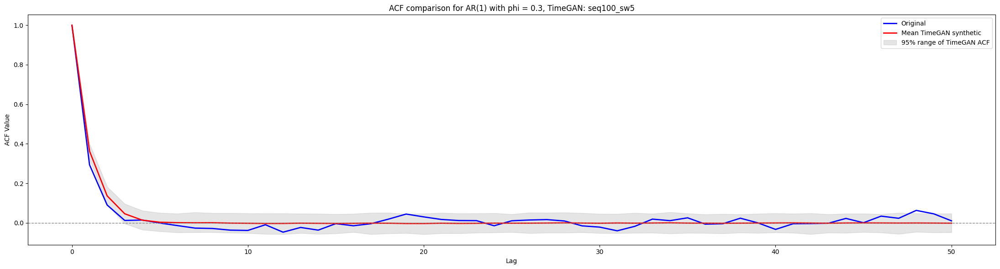

In [113]:
plot_best_timegan_acf_result('AR(1) with phi = 0.3')

Best experiment: seq100_sw15_zDim10
Mean ACF error: 0.0791


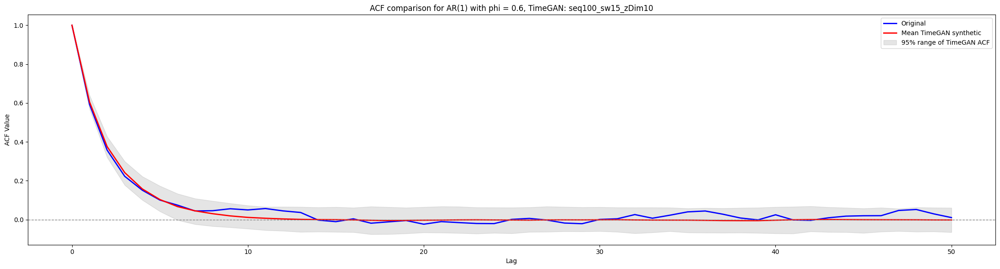

In [114]:
plot_best_timegan_acf_result('AR(1) with phi = 0.6')

Best experiment: seq100
Mean ACF error: 0.2466


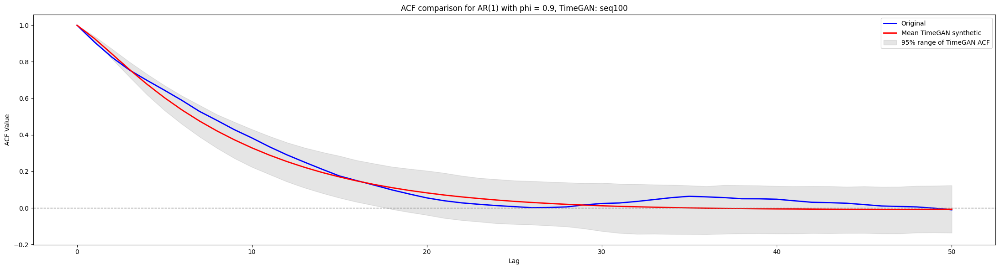

In [115]:
plot_best_timegan_acf_result('AR(1) with phi = 0.9')

In [116]:
#Dropping the column that MBB and Sieve don't have
TimeGANSummary = TimeGANBestSummary.drop(columns=["Experiment"])

#Concatenating
finalSummary = pd.concat(
    [mbbSummary, SieveSummary, TimeGANSummary],
    ignore_index=True
)

finalSummary.sort_values(['Series', 'mean_acf_error'])

,Method,Tuning,Series,mean_acf_error,acf_error_95ci,mean_error_mean,mean_error_95ci,variance_error_mean,variance_error_95ci
9,Moving Block Bootstrap,block size = 100,AR(1) with phi = 0.3,0.0311,"[0.0302, 0.032]",0.0250,"[0.0234, 0.0266]",0.0334,"[0.0312, 0.0356]"
12,Sieve Bootstrap,p = 50 selected by AIC,AR(1) with phi = 0.3,0.0313,"[0.0305, 0.0321]",0.0263,"[0.0246, 0.028]",0.0319,"[0.0299, 0.034]"
6,Moving Block Bootstrap,block size = 50,AR(1) with phi = 0.3,0.0400,"[0.0391, 0.0409]",0.0215,"[0.02, 0.023]",0.0297,"[0.0277, 0.0316]"
3,Moving Block Bootstrap,block size = 20,AR(1) with phi = 0.3,0.0506,"[0.0495, 0.0517]",0.0233,"[0.0217, 0.0249]",0.0304,"[0.0284, 0.0323]"
0,Moving Block Bootstrap,block size = 10,AR(1) with phi = 0.3,0.0555,"[0.0545, 0.0565]",0.0240,"[0.0225, 0.0256]",0.0310,"[0.0289, 0.0331]"
15,Sieve Bootstrap,p = 1 selected by BIC,AR(1) with phi = 0.3,0.0568,"[0.0556, 0.058]",0.0260,"[0.0242, 0.0277]",0.0324,"[0.0302, 0.0346]"
18,TimeGAN,"seqLen=100, h=12, nL=1, z=5, sw=5, mw=1",AR(1) with phi = 0.3,0.0678,"[0.0663, 0.0693]",0.0305,"[0.0285, 0.0325]",0.0786,"[0.0765, 0.0807]"
10,Moving Block Bootstrap,block size = 100,AR(1) with phi = 0.6,0.0520,"[0.0498, 0.0543]",0.0484,"[0.0451, 0.0516]",0.0474,"[0.0442, 0.0505]"
13,Sieve Bootstrap,p = 50 selected by AIC,AR(1) with phi = 0.6,0.0548,"[0.0524, 0.0573]",0.0517,"[0.0483, 0.0552]",0.0565,"[0.0529, 0.0602]"
7,Moving Block Bootstrap,block size = 50,AR(1) with phi = 0.6,0.0601,"[0.0579, 0.0622]",0.0506,"[0.0474, 0.0539]",0.0475,"[0.0444, 0.0507]"


In [117]:
#The method with smallest mean acf error for each series
bestSummary = (finalSummary.sort_values("mean_acf_error").groupby("Series", as_index=False).first())

bestSummary

,Series,Method,Tuning,mean_acf_error,acf_error_95ci,mean_error_mean,mean_error_95ci,variance_error_mean,variance_error_95ci
0,AR(1) with phi = 0.3,Moving Block Bootstrap,block size = 100,0.0311,"[0.0302, 0.032]",0.0250,"[0.0234, 0.0266]",0.0334,"[0.0312, 0.0356]"
1,AR(1) with phi = 0.6,Moving Block Bootstrap,block size = 100,0.0520,"[0.0498, 0.0543]",0.0484,"[0.0451, 0.0516]",0.0474,"[0.0442, 0.0505]"
2,AR(1) with phi = 0.9,Sieve Bootstrap,p = 50 selected by AIC,0.2037,"[0.1865, 0.2209]",0.1965,"[0.1838, 0.2092]",0.4469,"[0.4168, 0.4771]"


Two sample t-test (Unpooled) about acf errors

In [118]:
#The function which computes the acf error for each 500 synthetic sample
def get_acf_error_array(original, samples, maxLag = 50):
  acfErrors = []

  #Storing acf error of each synthetic data
  for sample in samples:
    acfErrors.append(acf_error(original, sample, maxLag = maxLag))

  return np.array(acfErrors)

In [119]:
def welch_acf_test(errorsMethod, errorsTimeGAN, methodName):
  meanMethod = np.mean(errorsMethod)
  meanTimeGAN = np.mean(errorsTimeGAN)

  meanDifference = meanMethod - meanTimeGAN

  # Sample size
  nMethod = len(errorsMethod)
  nTimeGAN = len(errorsTimeGAN)

  # Sample variance
  varMethod = np.var(errorsMethod, ddof = 1)
  varTimeGAN = np.var(errorsTimeGAN, ddof = 1)

  # Standard error for the difference in means
  seDifference = np.sqrt(varMethod / nMethod + varTimeGAN / nTimeGAN)

  #Degrees of freedom
  numerator = (varMethod / nMethod + varTimeGAN / nTimeGAN) ** 2
  denominator = ((varMethod / nMethod) ** 2 / (nMethod - 1)) + ((varTimeGAN / nTimeGAN) ** 2 / (nTimeGAN - 1))
  degreesFreedom = numerator / denominator

  # 95% confidence interval for the mean difference
  tCritical = stats.t.ppf(0.975, degreesFreedom)
  lowerCI = meanDifference - tCritical * seDifference
  upperCI = meanDifference + tCritical * seDifference

  #One sided two sample t-test (Unpooled t-test)
  #Ha: The statistical method has smaller mean ACF error than TimeGAN
  testResult = stats.ttest_ind(errorsMethod, errorsTimeGAN, equal_var = False, alternative = 'less')

  #Printint out the result
  print(methodName, "and TimeGAN")
  print("Mean ACF error of", methodName, ":", meanMethod)
  print("Mean ACF error of TimeGAN:", meanTimeGAN)
  print("Mean difference:", meanDifference)
  print("95% CI for mean difference:", [float(lowerCI), float(upperCI)])
  print("p-value:", testResult.pvalue)

  if testResult.pvalue < 0.05:
    print('Result: There is sufficient evidence to conclude that', methodName, 'has smaller mean ACF error than TimeGAN')
  else:
    print('Result: There is no sufficient evidence to conclude that', methodName, 'has smaller mean ACF error than TimeGAN')

  print()

In [120]:
print(mbbSummary["Series"].unique())
print(SieveSummary["Series"].unique())
print(TimeGANTuningSummary["Series"].unique())

['AR(1) with phi = 0.3' 'AR(1) with phi = 0.6' 'AR(1) with phi = 0.9']
['AR(1) with phi = 0.3' 'AR(1) with phi = 0.6' 'AR(1) with phi = 0.9']
['AR(1) with phi = 0.3' 'AR(1) with phi = 0.6' 'AR(1) with phi = 0.9']


In [121]:
for seriesName in phiNames:

  print("=" * 100)
  print(seriesName)
  print("=" * 100)

  original = originalSeries[seriesName]

  altSeriesName = f"AR(1) with {seriesName}"

  #Best TimeGAN, MBB, Sieve for this series
  bestTimeGANRow = (TimeGANTuningSummary[TimeGANTuningSummary["Series"] == altSeriesName].sort_values('mean_acf_error').iloc[0])
  bestMbbRow = (mbbSummary[mbbSummary["Series"] == altSeriesName].sort_values('mean_acf_error').iloc[0])
  bestSieveRow = (SieveSummary[SieveSummary["Series"] == altSeriesName].sort_values('mean_acf_error').iloc[0])

  #Getting the experiment setting which had lowest ACF error and those acf errors as numpy array
  timeganExperiment = bestTimeGANRow['Experiment']
  timeganSamples = TimeGANsamplesAll[(timeganExperiment, altSeriesName)]
  timeganErrors = get_acf_error_array(original, timeganSamples, maxLag = maxLag)

  #block size shoule be mostly 100 from repeated experiments
  mbbTuning = bestMbbRow['Tuning']
  blockSize = int(mbbTuning.replace('block size = ', ''))
  mbbSamples = MBBsamplesAll[blockSize][seriesName]
  mbbErrors = get_acf_error_array(original, mbbSamples, maxLag = maxLag)

  #Welch's t-test for MBB and TimeGAN
  print("Best MBB tuning:", mbbTuning)
  print("Best TimeGAN experiment:", timeganExperiment)
  welch_acf_test(mbbErrors, timeganErrors, "Moving Block Bootstrap")

  sieveTuning = bestSieveRow["Tuning"]
  criterion = sieveTuning.split("selected by ")[1]

  sieveSamples = SIEVEsamplesAll[criterion][seriesName]
  sieveErrors = get_acf_error_array(original, sieveSamples, maxLag=maxLag)

  #Welch's t-test for Sieve and TimeGAN
  print("Best Sieve tuning:", sieveTuning)
  print("Best TimeGAN experiment:", timeganExperiment)
  welch_acf_test(sieveErrors, timeganErrors, "Sieve Bootstrap")

phi = 0.3
Best MBB tuning: block size = 100
Best TimeGAN experiment: seq100_sw5
Moving Block Bootstrap and TimeGAN
Mean ACF error of Moving Block Bootstrap : 0.031112052968473244
Mean ACF error of TimeGAN: 0.0677853370263177
Mean difference: -0.03667328405784445
95% CI for mean difference: [-0.0384438991769725, -0.0349026689387164]
p-value: 5.614555847285754e-197
Result: There is sufficient evidence to conclude that Moving Block Bootstrap has smaller mean ACF error than TimeGAN

Best Sieve tuning: p = 50 selected by AIC
Best TimeGAN experiment: seq100_sw5
Sieve Bootstrap and TimeGAN
Mean ACF error of Sieve Bootstrap : 0.03132633937047852
Mean ACF error of TimeGAN: 0.0677853370263177
Mean difference: -0.03645899765583918
95% CI for mean difference: [-0.03819032367751908, -0.03472767163415928]
p-value: 2.793896839715735e-196
Result: There is sufficient evidence to conclude that Sieve Bootstrap has smaller mean ACF error than TimeGAN

phi = 0.6
Best MBB tuning: block size = 100
Best TimeG